# **Yoga Pose Classification** 

### Group Name: Good Students
### Group Members:
- Renfei Yu (Klaus) - z5546743
- Wenxuan Wang - z5464319
- Hesong Zhang - z5532689
- Renhua Luo - z5408176
- Yi Zhao - z5530832




### **1. General Statements**
#### 1.1 Introduction

Yoga is an ancient fitness activity that enhances both the body and mind through various poses. However, identify each yoga pose accurately is important to ensure right practice, effective monitoring, and timely correction. Through this project, we hope to promote the technology of yoga practice, so that yoga lovers can practice yoga more safely and scientifically, and also promote the application of computer vision in the field of health and fitness.

#### 1.2.Motivation

However, there are many yoga enthusiasts who are unable to accept professional systematic yoga teaching. They can get injured when practicing many yoga poses due to non-standard movements. So we came up with a solution: using deep learning technology to automate the yoga pose recognition process. This allows accurate and real-time adjustment of the yoga practitioner's posture. This method can not only be applied in individual yoga practice to help practitioners improve posture, but also help coaches to manage and guide in large classes.

#### 1.3.Problem Statement

**Occlusions and Partial Visibility:** In practice, yoga poses might be partially visible or occluded by objects or other people, especially in a class setting or when practiced at home with limited space.  This can significantly challenge the model's ability to accurately recognize and classify the poses based on incomplete visual data.

**Similarity Among Poses:** Many yoga poses have subtle differences and can appear very similar to each other, especially in more complex sequences or variations.  This similarity can lead to high rates of misclassification, as deep learning models might struggle to distinguish fine-grained differences between poses solely from visual inputs.

### **2.Dataset**
#### 2.1 Data Sources

The image dataset is obtained from a paper titled “Yoga-82: A New Dataset for Fine-grained Classification of Human Poses”: https://neurohive.io/en/news/yoga-82-new-dataset-with-complex-yoga-poses/。 The dataset, Yoga-82, was developed by researchers Manisha Verma, Sudhakar Kumawat, Yuta Nakashima, and Shanmuganathan Raman, as part of their work at Osaka University, Japan, and Indian Institute of Technology Gandhinagar, India. The dataset was developed to address the challenges of fine-grained classification of yoga poses, with hierachical structures to capture various body positions and pose variations (Citation needed). 



The dataset is downloaded from a Google drive with a link contained in the webpage mentioned above. The dataset is intended for non-commercial research and educational purposes. 

#### 2.2 Dataset Acquisition

As mentioned above, the dataset is incomplete and extra work is needed on our part to acquire the image files. For this purpose, we made a script to process the 82 yoga pose text files containing yoga pose image URLs:

In short, the script performed the following steps:
##### Step 1: Set Up
- set up a base folder and locate the yoga pose text files

##### Step 2: Process Each Text File
- for each text file:
  - create a corresponding folder for the yoga pose
  - read image URLs and download them

##### Step 3: Save image data
- save the images in the corresponding folder

After executing this script. We will have 82 folders where each folder represents a type of yoga pose. Each folder contains all the images associated with a particular yoga pose.


In [ ]:
# Note to grader: Please don't execute this cell as there are many error exceptions and long wait-time

import os
import requests
from concurrent.futures import ThreadPoolExecutor, as_completed
import webbrowser
import shutil


# set the path to the folder containing the 82 yoga pose text files
base_folder = os.path.dirname(os.path.abspath(__file__))

# a folder to keep track of all the text files processed thus far
downloaded_dir = os.path.join(base_folder, "Downloaded")

# a function to download a single image
def download_image(image_name, image_url, pose_dir):
    
    # get the image path
    image_path = os.path.join(base_folder, image_name)

    # check if the image already exists
    if os.path.exists(image_path):
        print(f"Image {image_name} already exists. Skip it")
        return 

    # to mimic a browser downloading the images. To prevent websites detecting this script
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.88 Safari/537.36"
    }

    try:
        # send get request
        response = requests.get(image_url, headers=headers, stream=True, timeout=10)
        if response.status_code == 200 :
            # save image in the respective directory
            with open(image_path, 'wb') as img_file:
                for chunk in response.iter_content(1024):
                    img_file.write(chunk)
            print(f"Downloaded {image_name} to {pose_dir}")
        
        # to handle error codes
        elif response.status_code in [404, 500, 503, 523, 400, 410, 401]:
            return
            print(f"Failed to download {image_name} from {image_url}")

    except requests.exceptions.Timeout:
        print(f"Timeout occurred for {image_name} from {image_url}")

    # network error
    except requests.exceptions.RequestException as e:
        print(f"Error downloading {image_name} from {image_url}: {e}")

# loop through each text file in the folder
for txt_file in os.listdir(base_folder):
    if txt_file.endswith(".txt"):
        # create a directory for each pose based on the class name
        pose_name = txt_file.replace(".txt", "")
        pose_dir = os.path.join(base_folder, pose_name)
        
        # skip the directory if it already exists
        if not (os.path.isdir(pose_dir)):
            os.makedirs(pose_dir, exist_ok=True)

        # prepare a list of image download tasks
        tasks = []

        # open the text file and read each line
        with open(os.path.join(base_folder, txt_file), 'r') as file:
            for line in file:
                # split each line to get the image name and URL
                try:
                    image_name, image_url = line.strip().split('\t')

                    image_path = os.path.join(base_folder, image_name)
                    if os.path.exists(image_path):
                        continue
                    tasks.append((image_name, image_url, pose_dir))
                except ValueError:
                    print(f"invalid line format")

        # download images concurrently using ThreadPoolExecutor
        with ThreadPoolExecutor(max_workers=30) as executor:  
            futures = [executor.submit(download_image, image_name, image_url, pose_dir) for image_name, image_url, pose_dir in tasks]
            
            for future in as_completed(futures):
                try:
                    future.result()
                except Exception as e:
                    print(f"Error occurred during image download: {e}")

        # move the text file to the "Downloaded" directory after processing. To keep track of progress
        shutil.move(os.path.join(base_folder, txt_file), os.path.join(downloaded_dir, txt_file))
        print(f"moved {txt_file} to the Downloaded directory")

#### 2.3 Data Description

Yoga-82 contains over 28,000 images of yoga poses across 82 unique classes, each representing a different yoga pose/body position variations. The dataset includes poses from various camera angle and in different environments, with a mix of clean and complex backgrounds. Image formats include JPG and PNG, and of various resolutions. 

Yoga-82 uses a 3-level hierarchical structure where:
1. Level 1 represents 6 main categories, such as *standing*, *sitting*, *balancing*, *inverted*, *reclining*, and *wheel*
2. Level 2 represents 20 subcategories beneath level 1 main categories, representing variations such as leg position or orientations (e.g. forward bend or side bend for the Level 1 *standing* position etc), and
3. Level 3 is the specific yoga pose and there are 82 poses in total

Note that in this project, we focused only on level 3 yoga poses and treat each pose as a separate class. Therefore, we have 82 classes for the pose prediction problem.
The dataset includes 2 text files (*yoga_test.txt* and *yoga_train.txt*) in relation to how the authors splitted the dataset and a folder of 82 text files (*yoga_dataset_links*), where each text file contains image URLs for the images that belong to a particular class of yoga pose. There is also an accompanying *Readme.txt* file that gives instructions on how to utilise the dataset. 

Both *yoga_test.txt* and *yoga_train.txt* have the same layout. Where a row corresponds to an image and the columns are in relation to the image name and address, the label of the main class, the label of the subcategory and the label of the individual poses, respectively.


For each of the 82 text files contained in the *yoga_dataset_links* folder, a row correspnds to an image and the columns are in relation to the image name and address and the image URL.


For *yoga_test.txt* and *yoga_train.txt*, due to invalid URLs in the dataset (more details next page), we did not use these text files to split the dataset for the fear of class imbalance (as each class of yoga pose is disproportionaly affected by invalid URLs). Instead, after downloading all the valid images, we split the dataset into 80% train set (11959) and 20% test set (6674) based on the level 3 classes ourselves. 

### **3.Exploratory Analysis of Data**
#### 3.1 Dataset properties 
##### 3.1.1 Base dataset information

The script below counts 
- 1) the total number of images, 
- 2) the number of classes and,
-  3) the number of images per class

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from pandas import option_context

dataset_path = r'./Dataset/yoga_dataset_links'  # Update as needed

# dictionary to store class names and their corresponding image counts
class_counts = {}

# loop through each subfolder in the dataset folder
for class_name in os.listdir(dataset_path):
    class_folder = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_folder):
        # count the number of images in the subfolder
        num_images = len([file for file in os.listdir(class_folder) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
        class_counts[class_name] = num_images

# calculate the total number of images in the dataset
total_images = sum(class_counts.values())

print(f"Total number of images in the dataset: {total_images}")

# calculate the total number of classes
total_classes = len(class_counts)

print(f"Total number of classes: {total_classes}")

# sort classes by count
sorted_classes = sorted(class_counts.items(), key=lambda item: item[1], reverse=True)
sorted_class_names = [item[0] for item in sorted_classes]
sorted_class_counts = [item[1] for item in sorted_classes]

# dataframe to display the class names and their counts
data = {"class name": sorted_class_names, "number of images": sorted_class_counts}
df = pd.DataFrame(data)

display(df) 

##### 3.1.2 Data quality assessment

1. Check for corrupt/invalid images

The code below uses the Pillow library to remove any image files that are corrupt/invalid.

In [ ]:
from PIL import Image, ImageFile

# to handle truncated or incomplete image files gracefully during image verification
ImageFile.LOAD_TRUNCATED_IMAGES = True

dataset_path = r'./Dataset/yoga_dataset_links'

# counters to keep track of the remaining files and the number of files removed
removed_files_count = 0
total_files_count = 0

# loop through each subfolder in the dataset folder
for class_name in os.listdir(dataset_path):
    class_folder = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_folder):
        for file in os.listdir(class_folder):
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                total_files_count += 1 
                filepath = os.path.join(class_folder, file)
                try:
                    # use "with" to ensure the file is closed after verification
                    with Image.open(filepath) as img:
                        img.verify()  # verify whether the file can be opened normally
                except (IOError, SyntaxError, OSError):
                    print(f"Corrupt file detected and removed: {filepath}")
                    removed_files_count += 1 
                    try:
                        os.remove(filepath) 
                    except PermissionError:
                        print(f"Couldn't delete {filepath} as it is being used by another process")

print("All image files are verified successfully")

remaining_files_count = total_files_count - removed_files_count

# summary
print(f"Total image files in the dataset: {total_files_count}")
print(f"Number of corrupt files removed: {removed_files_count}")
print(f"Number of remaining image files: {remaining_files_count}")


2. Remove duplicated images

The code below uses MD5 hashing function from Python's hashlib to compute image file hashes at the byte level. For our purpose, only identical duplicates are removed so this byte-for-byte level hashing function is appropriate. The script will iterate over the dataset, compute the hashes for each image and then identify exact duplicates based on matching hashes.

In [ ]:
import hashlib
import os

# computes a file's hash using MD5 hashing algorithm
def compute_image_hash(filepath, hash_algorithm='md5'):
    """
    parameters:
    filepath (str): path to the file
    hash_algorithm (str): hashing algorithm chosen i.e. md5
    
    returns:
    str: the computed hash as a hexadecimal string
    """
    hash_function = hashlib.new(hash_algorithm)
    with open(filepath, 'rb') as f:
        while chunk := f.read(8192): 
            hash_function.update(chunk)
    return hash_function.hexdigest()

# function to find exact duplicate images based on file content hashes
def find_exact_duplicates(dataset_path, hash_algorithm='md5'):
    """
    parameters:
        dataset_path (str): path to the file
        hash_algorithm (str): hashing algorithm chosen i.e. md5
    
    Returns:
        list: a list of tuples containing duplicate file paths
    """
    hashes = {}
    duplicates = []

    # loop through all image files in the dataset
    for class_name in os.listdir(dataset_path):
        class_folder = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_folder):
            for file in os.listdir(class_folder):
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    filepath = os.path.join(class_folder, file)
                    try:
                        # compute the file's hash
                        file_hash = compute_image_hash(filepath, hash_algorithm)

                        # check for duplicates
                        if file_hash in hashes:
                            duplicates.append((filepath, hashes[file_hash]))
                            print(f"Duplicate found at {filepath} is a duplicate of {hashes[file_hash]}")

                            """ # Open both images for inspection
                            img1 = Image.open(filepath)
                            img2 = Image.open(hashes[file_hash])
                            img1.show(title="Duplicate 1")
                            img2.show(title="Duplicate 2") """
                        else:
                            hashes[file_hash] = filepath
                    except Exception as e:
                        print(f"error processing {filepath} and the error is {e}")
    
    return duplicates

# removes duplicate files from the yoga dataset
def remove_duplicates(duplicates):
    """
    parameters:
    duplicates (list): a list of tuples containing duplicate file paths
    """
    for dup, _ in duplicates:
        try:
            os.remove(dup)
            print(f"removed {dup}")
        except Exception as e:
            print(f"An error occurred while removing {dup} and the error is {e}")

dataset_path = r'./Dataset/yoga_dataset_links'
duplicates = find_exact_duplicates(dataset_path, hash_algorithm='md5')  # 'md5' or 'sha256'. md5 is faster

print(f"Total duplicates found = {len(duplicates)}")

if duplicates:
    remove_duplicates(duplicates)


3. Data augmentation

In real-world applications, variations in pose orientations, viewpoints, and scales are inevitable. These variations could lead to poor generalisation for the model and risk overfitting to specific patterns or features in the training dataset. To address these challenges, data augmentation plays an important role in enhancing the diversity and robustness of the dataset. 

Data augmentation increases dataset diversity and robustness by simulating these potential variations and make the model more robust to them. Not to mention the benefit of mitigating the class imbalance issue mentioned above, by artificially increasing the number of images for the underrepresented classes. 

In Chapter Four (Method Application), we will explore in detail how data augmentation techniques, such as flipping, cropping, or scaling are implemented to improve model performance and generalization.

##### 3.2 Class distribution

The code below creates a pie chart that illustrates the distribution of classes in the yoga dataset, with each segment representing a yoga pose class.

In [ ]:
import math

# Create a dictionary mapping indices to class names and percentages
class_percentages = []
for count in sorted_class_counts:
    class_percentages.append((count / total_images) * 100 )

# create a class index to percentage mapping
index_to_class_with_percentage = {}
for index, (class_name, percentage) in enumerate(zip(sorted_class_names, class_percentages)):
    index_to_class_with_percentage[index] = (class_name, f"{percentage:.2f}%")                                         
                                                 

plt.figure(figsize=(16, 10))  

# pie chart for class distribution vasualisation
wedges, texts = plt.pie(sorted_class_counts)

# Add class indices as labels outside the pie chart with directed arrows
for i, wedge in enumerate(wedges):
    # calculate the midpoint angle of the wedge i.e central position of the wedge along the circular path. We put the label at this position
    angle = (wedge.theta2 + wedge.theta1) / 2  

    # calculate the x and y coordinates for placing the label outside the pie chart
    # 1. the angle is converted to radians because trigonometric functions in python use radians
    # 2. the distance (1.3) determines how far outside the circle the label will appear
    # 3. `cos` determines the horizontal position (x-axis), while `sin` determines the vertical position (y-axis)
    # this places the label slightly outside the edge of the pie chart for better visibility
    x = 1.3 * math.cos(math.radians(angle)) 
    y = 1.3 * math.sin(math.radians(angle))  
    
    plt.annotate(
        str(i),
        xy=(math.cos(math.radians(angle)), math.sin(math.radians(angle))),
        xytext=(x, y),
        arrowprops=dict(arrowstyle="->", color="black"),
        fontsize=7,
    )


plt.tight_layout(pad=10)  

# now create a new figure for the legend
plt.figure(figsize=(12, 12)) 
legend_labels = []
for index, (class_name, percentage) in index_to_class_with_percentage.items():
    legend_labels.append(f"{index}: {class_name} ({percentage})")
    

plt.legend(
    handles=wedges,
    labels=legend_labels,
    title="Class indices to class names mapping",
    loc="center",
    fontsize="small",
    ncol=2,
    title_fontsize=12,
)
plt.title("Class distribution in the yoga Dataset", fontsize=14)
plt.axis("off") 
plt.tight_layout()
plt.show()


We can make the following observations:
1. There appears to be some degree of class imbalance. 
- A not-insignificant number dominate a larger (than average) share of the dataset. Namely, *Cobra pose or Bhujangsana*, *Sitting pose 1 (normal)* and *Extended revolved side angle pose*. This may lead to biased learning during training.
- A large number of classes have very low percentages of total images such as *Noose Pose* and *Dolphin Plank Pose* etc. This could make it challenging for a model to generalize well for these poses.
2. Implication: The class imbalance could lead to model overfil on the dominant classes while underfit on underrepresented ones. This necessitates techniques like data augmentation (rotation, scaling and flipping etc) and class-weight balancing during training. 


#### 3.3 Train-test split

The dataset is split into 80% training set and 20% test set and saved into 2 seperate directories as follows:

In [ ]:
import random
import shutil

# source dataset directory
source_dir = './Dataset/yoga_dataset_links'

# destination directories for training and test sets
train_dir = './Dataset/train_set'
test_dir = './Dataset/test_set'

# create destination directories 
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# keep counters for the number of images in training and test sets
train_count = 0
test_count = 0

# loop through each class folder
for class_name in os.listdir(source_dir):
    class_folder = os.path.join(source_dir, class_name)
    if os.path.isdir(class_folder):
        # retreive all image files in the class folder
        images = []
        for file in os.listdir(class_folder):
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                images.append(file)
        
        # split into 80% train and 20% test
        split_index = int(len(images) * 0.8)
        train_images = images[:split_index]
        test_images = images[split_index:]
        
        # create class subfolders in train and test directories
        train_class_dir = os.path.join(train_dir, class_name)
        test_class_dir = os.path.join(test_dir, class_name)
        os.makedirs(train_class_dir, exist_ok=True)
        os.makedirs(test_class_dir, exist_ok=True)
        
        # move training images
        for image in train_images:
            shutil.copy(os.path.join(class_folder, image), os.path.join(train_class_dir, image))
        train_count += len(train_images)
        
        # move test images
        for image in test_images:
            shutil.copy(os.path.join(class_folder, image), os.path.join(test_class_dir, image))
        test_count += len(test_images)

# print the results
print(f"Total training images = {train_count}")
print(f"Total test images: {test_count}")


#### 3.4 Challenging Aspects:
The Yoga-82 dataset presents several challenges:

3.4.1. There are numerous irrelevant images in the dataset. 

3.3.2. Since the images were downloaded from various websites. Some websites were no longer accessible and thus 18,600 out of 28,000 images were downloaded (33.6% loss of data). In addition, some images are invalid and thus need to be discarded.

3.3.3. A subset of the images are cartoon and random images. Some of the poses are different from each other despite being in the same class

3.3.4. As stated above, there is a not-insignificant degree of class imbalance

### **4. Method Application**

In this section, the models and corresponding operations will be discussed

**Model 1: CNN + MobileNetV3** Combines CNN with the lightweight MobileNetV3 architecture to achieve efficient image classification and feature extraction, offering high real-time performance with low computational cost, especially on mobile devices.

**Model 2: CNN + MediaPipe** Integrates MediaPipe for keypoint detection with CNN for tasks like pose estimation or specific recognition, delivering fast processing speed and cross-platform adaptability.

**Model 3: MoveNet** A high-performance single-person pose estimation model developed by Google, capable of real-time detection of human keypoints with a balance between precision and speed, ideal for low-latency applications.

**Model 4: Xception** An enhanced model leveraging depthwise separable convolutions for more efficient feature extraction, achieving high performance in image classification and detection tasks, particularly with complex datasets.

**Model 5: DenseNet201** Based on densely connected layers, this deep network reuses features to reduce parameters, excelling in large-scale image classification tasks and scenarios demanding high accuracy.


#### 4.1 Method 1: CNN + MobileNetV3

##### 4.1.1 Import Necessary Libraries

In [ ]:
# Import Data Science Libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import itertools
import random

# Import visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
from PIL import Image, ImageFile

# Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers,models
from keras_preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint,TensorBoard
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import Model
# from tensorflow.keras.layers import Rescaling, Normalization, RandomFlip, RandomRotation
from tensorflow.keras.layers.experimental import preprocessing

# Check if GPU is available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("Using GPU:", tf.config.list_physical_devices('GPU')[0])
else:
    print("No GPU detected, using CPU instead.")


# System libraries
from pathlib import Path
import os.path
import requests
import sys
import os

# Metrics
from sklearn.metrics import classification_report, confusion_matrix

Num GPUs Available:  1
Using GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


##### 4.1.2 Create Helper Functions

In [ ]:
# Set the file URL
url = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py"

file_path = "helper_functions.py"

# Check if the file already exists
if not os.path.exists(file_path):
    # Send a GET request to fetch the file content
    response = requests.get(url)
    
    # Write the content to the file
    with open(file_path, "wb") as file:
        file.write(response.content)
    
    print("Download complete!")
else:
    print("helper_functions.py already exists locally. Skipping download.")

# Add the current working directory to the Python path
sys.path.append(os.getcwd())

# Import series of helper functions for our notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot

helper_functions.py already exists locally. Skipping download.


##### 4.1.3 Load and Transform Data

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)

# Walk through each directory
dataset = "../yoga_dataset_links"
walk_through_dir(dataset)

There are 82 directories and 0 images in '../yoga_dataset_links'.
There are 0 directories and 84 images in '../yoga_dataset_links\Akarna_Dhanurasana'.
There are 0 directories and 76 images in '../yoga_dataset_links\Bharadvaja's_Twist_pose_or_Bharadvajasana_I_'.
There are 0 directories and 372 images in '../yoga_dataset_links\Boat_Pose_or_Paripurna_Navasana_'.
There are 0 directories and 260 images in '../yoga_dataset_links\Bound_Angle_Pose_or_Baddha_Konasana_'.
There are 0 directories and 216 images in '../yoga_dataset_links\Bow_Pose_or_Dhanurasana_'.
There are 0 directories and 251 images in '../yoga_dataset_links\Bridge_Pose_or_Setu_Bandha_Sarvangasana_'.
There are 0 directories and 307 images in '../yoga_dataset_links\Camel_Pose_or_Ustrasana_'.
There are 0 directories and 404 images in '../yoga_dataset_links\Cat_Cow_Pose_or_Marjaryasana_'.
There are 0 directories and 302 images in '../yoga_dataset_links\Chair_Pose_or_Utkatasana_'.
There are 0 directories and 293 images in '../yoga_d

##### 4.1.4 Placing Data into a Dataframe

In [4]:
image_dir = Path(dataset)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png')) + list(image_dir.glob(r'**/*.png'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

image_df

,Filepath,Label
0,..\yoga_dataset_links\Akarna_Dhanurasana\0_15.jpg,Akarna_Dhanurasana
1,..\yoga_dataset_links\Akarna_Dhanurasana\0_162...,Akarna_Dhanurasana
2,..\yoga_dataset_links\Akarna_Dhanurasana\0_18.jpg,Akarna_Dhanurasana
3,..\yoga_dataset_links\Akarna_Dhanurasana\0_305...,Akarna_Dhanurasana
4,..\yoga_dataset_links\Akarna_Dhanurasana\0_377...,Akarna_Dhanurasana
...,...,...
37195,..\yoga_dataset_links\viparita_virabhadrasana_...,viparita_virabhadrasana_or_reverse_warrior_pose
37196,..\yoga_dataset_links\viparita_virabhadrasana_...,viparita_virabhadrasana_or_reverse_warrior_pose
37197,..\yoga_dataset_links\viparita_virabhadrasana_...,viparita_virabhadrasana_or_reverse_warrior_pose
37198,..\yoga_dataset_links\Cobra_Pose_or_Bhujangasa...,Cobra_Pose_or_Bhujangasana_


##### 4.1.5 Visualizing Images from dataset

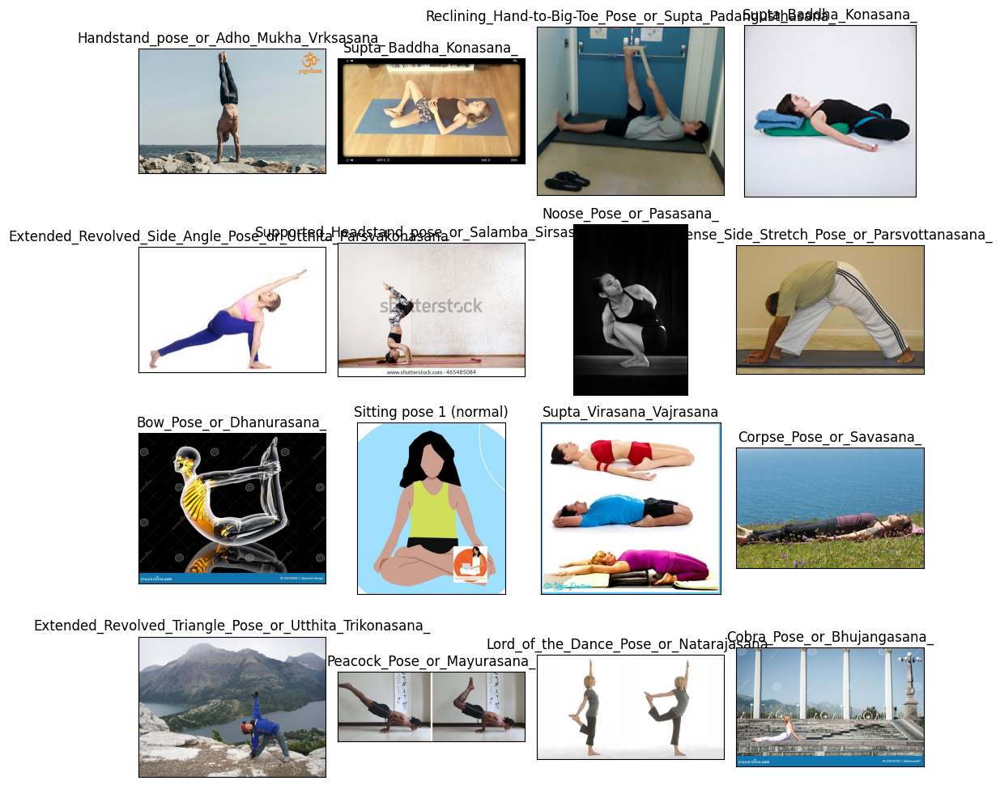

In [9]:
# Display 9 picture of the dataset with their labels
random_index = np.random.randint(0, len(image_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()

##### 4.1.6 Computing Error Rate Analysis

In [10]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff


def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image


def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

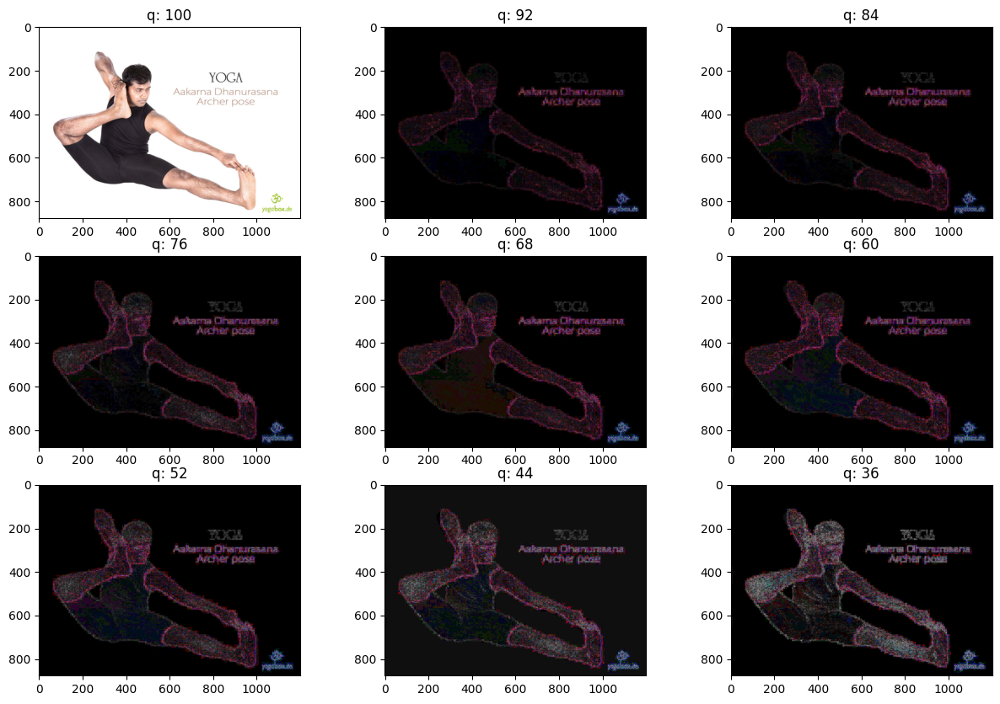

In [11]:
# View random sample from the dataset
p = random_sample('../yoga_dataset_links/Akarna_Dhanurasana')
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

##### 4.1.7 Data Preprocessing
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The dataset will be divided into three categories: Training, Validation, and Testing. The training data will be utilized to train the CNN model, while the validation data will be used to fine-tune the model's parameters. Lastly, the model's performance will be tested using the test data, which consists of unseen data that the model has not encountered during training and validating.</p>

In [ ]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=1)

# Load truncated image error settings
ImageFile.LOAD_TRUNCATED_IMAGES = True

# Check and remove corrupted image files, and update the DataFrame
def check_images(dataframe, filepath_col='Filepath'):
    valid_files = []
    for filepath in dataframe[filepath_col]:
        if not os.path.exists(filepath):
            print(f"File not found, skipping: {filepath}")
            continue
        try:
            # Use the with statement to ensure the file is closed after checking
            with Image.open(filepath) as img:
                img.verify()  # Check if the image can be opened normally
            valid_files.append(filepath)  # Record valid files
        except (IOError, SyntaxError, OSError):
            print(f"Corrupted file detected and removed: {filepath}")
            try:
                os.remove(filepath)  # Delete corrupted files
            except PermissionError:
                print(f"Could not delete {filepath} as it is being used by another process.")
    
    # Update the DataFrame to keep only valid files
    return dataframe[dataframe[filepath_col].isin(valid_files)].reset_index(drop=True)

# Check and update the training and test data DataFrame
train_df = check_images(train_df)
test_df = check_images(test_df)
# Check the training and test data
check_images(train_df)
check_images(test_df)


d:\Anaconda\envs\CVNN\lib\site-packages\PIL\TiffImagePlugin.py:900: UserWarning: Truncated File Read
  warnings.warn(str(msg))


,Filepath,Label
0,..\yoga_dataset_links\Gate_Pose_or_Parighasana...,Gate_Pose_or_Parighasana_
1,..\yoga_dataset_links\Split pose\2_0_20.jpg,Split pose
2,..\yoga_dataset_links\Standing_big_toe_hold_po...,Standing_big_toe_hold_pose_or_Utthita_Padangus...
3,..\yoga_dataset_links\Reclining_Hand-to-Big-To...,Reclining_Hand-to-Big-Toe_Pose_or_Supta_Padang...
4,..\yoga_dataset_links\Plow_Pose_or_Halasana_\0...,Plow_Pose_or_Halasana_
...,...,...
7435,..\yoga_dataset_links\Bharadvaja's_Twist_pose_...,Bharadvaja's_Twist_pose_or_Bharadvajasana_I_
7436,..\yoga_dataset_links\Bow_Pose_or_Dhanurasana_...,Bow_Pose_or_Dhanurasana_
7437,..\yoga_dataset_links\Supta_Virasana_Vajrasana...,Supta_Virasana_Vajrasana
7438,..\yoga_dataset_links\Firefly_Pose_or_Tittibha...,Firefly_Pose_or_Tittibhasana_


In [13]:
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v3.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v3.preprocess_input
)

In [14]:
# Split the data into three categories.
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=False
)

Found 23808 validated image filenames belonging to 82 classes.
Found 5952 validated image filenames belonging to 82 classes.
Found 7440 validated image filenames belonging to 82 classes.


In [15]:
# Resize Layer
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(224,224),
  layers.experimental.preprocessing.Rescaling(1./255),
])

# Setup data augmentation
data_augmentation = keras.Sequential([
  preprocessing.RandomFlip("horizontal_and_vertical"),
  preprocessing.RandomRotation(0.2),
  preprocessing.RandomZoom(0.2),
  preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2),                       
], name="data_augmentation")

##### 4.1.8 Training setting
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The input images will be processed using a pre-trained CNN model, MobileNetV3. To monitor the training process effectively, three callbacks will be implemented: Model Checkpoint, Early Stopping, and TensorBoard. The detailed summary of the model's hyperparameters is provided below:</p>

**Batch size** : 64

**Epochs** : 100

**Input Shape** : (224, 224, 3)

**Output layer** : 82



In [21]:
# Load the pretained model
pretrained_model = tf.keras.applications.MobileNetV3Large(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

# pretrained_model.trainable = False

pretrained_model.trainable = True
for layer in pretrained_model.layers[:100]: 
    layer.trainable = False

12683000/12683000 [==============================] - 1s 0us/step


In [22]:
# Create checkpoint callback
checkpoint_path = "yoga_classification_model_checkpoint.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)


In [23]:
# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor="val_loss", # watch the val loss metric
                                                  patience=3,
                                                  restore_best_weights=True) # if val loss decreases for 3 epochs in a row, stop training

##### 4.1.9 Train the model

In [ ]:
# Check if GPU is available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("Using GPU:", tf.config.list_physical_devices('GPU')[0])
else:
    print("No GPU detected, using CPU instead.")


inputs = pretrained_model.input
x = resize_and_rescale(inputs)
x = data_augmentation(x)


x = pretrained_model(x, training=True)
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)



outputs = Dense(82, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=100,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", 
                                    "yoga_classification"),
        checkpoint_callback,
    ]
)

Num GPUs Available:  1
Using GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Saving TensorBoard log files to: training_logs/yoga_classification/20241112-185847


Epoch 1/100
103/372 [=======>......................] - ETA: 1:21 - loss: 4.3895 - accuracy: 0.0288

372/372 [==============================] - 146s 373ms/step - loss: 4.3288 - accuracy: 0.0366 - val_loss: 4.2310 - val_accuracy: 0.0521
Epoch 2/100
372/372 [==============================] - 135s 363ms/step - loss: 4.1874 - accuracy: 0.0604 - val_loss: 3.9854 - val_accuracy: 0.1005
Epoch 3/100
372/372 [==============================] - 134s 359ms/step - loss: 3.9492 - accuracy: 0.0964 - val_loss: 3.6669 - val_accuracy: 0.1603
Epoch 4/100
372/372 [==============================] - 134s 360ms/step - loss: 3.6807 - accuracy: 0.1403 - val_loss: 3.3751 - val_accuracy: 0.2004
Epoch 5/100
372/372 [==============================] - 134s 359ms/step - loss: 3.4677 - accuracy: 0.1793 - val_loss: 3.1730 - val_accuracy: 0.2455
Epoch 6/100
372/372 [==============================] - 135s 363ms/step - loss: 3.2824 - accuracy: 0.2137 - val_loss: 2.9764 - val_accuracy: 0.2799
Epoch 7/100
372/372 [==============================] - 134s 360ms/step - loss: 3.1051 - accuracy: 0.2463 - val_loss: 2.8324 - val_

#### 4.2 Method 2: 3D CNN + MediaPipe

Title: Enhanced yoga pose classification using 3D Voxel Grids and 3D Convolutional Neural Networks

##### 4.2.1 Introduction

Many previous studies have experimented with using skeletal representations to classify yoga poses. One such model, YogaConvo2d, achieved high accuracy by utilizing 2D skeletal landmarks generated using MediaPipe. Nonetheless, depth ambiguity and pose complexity remain a challenging issue in achieving higher accuracy across a diverse set of yoga postures. 

This section introduces an enhanced approach that leverages 3D pose landmarks, represented as voxel grids, to capture the spactial structure of yoga poses more effectively. We propose a 3D CNN architecture that draws direct inspiration from YogaConvo2d's structure, but geared towards processing 3D data.

##### 4.2.2 Related work
The baseline model is derived from the study "Yoga Pose Classification: A CNN and MediaPipe Inspired Deep Learning Approach", in which the authors used Mediapipe to extract skeletonized yoga pose images. And subsequently feed into a 3-layer CNN to classify 2D skeleton images, achieving an impressive 97.09% test accuracy over 5 classes of yoga poses. While effective, the approach was limited to 2D pose representations and missing out on potential potential depth-based features.

Furthermore, upon replicating the paper's model using our Yoga-82 dataset across 82 classes, the test accuracy stagnant at around 60%. Showing problems with using only 2D information


##### 4.2.3 Data preprocessing
In our model the skeletal landmarks extracted using Mediapipe were further extended into 3D space using depth estimation techniques supported by MediaPipe's advanced modules. These landmarks were normalised and mapped into 32 x 32 x 32 voxel grids. This also ensured uniform scaling across the dataset and capturing important geometric structure of the yoga poses. The code below performed the data preprocessing steps. After running the code below, there should a directory containing all 82 classes of yoga poses with the same directory structures, except that image files are replaced with Numpy files (np.ndarray).



In [ ]:
import cv2
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# initialize MediaPipe
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

# input and output folder paths
input_folder = r'./Dataset/yoga_dataset_links'
output_folder = r'./Dataset/yoga_dataset_links_voxel'

# make an output folder 
os.makedirs(output_folder, exist_ok=True)

# define voxel grid size (I have chosen 32x32x32)
grid_size = 32

# draw a line in 3D voxel grid using Bresenham's line algorithm
def draw_line_3d(grid, start_voxel, end_voxel):
    """
    parameters:
    grid (np.ndarray): 3D numpy array representing the voxel grid
    start_voxel (tuple): The starting voxel coordinates (in x, y, z coordinates)
    end_voxel (tuple): The ending voxel coordinates (in x, y, z coordinates)

    Credit: https://www.geeksforgeeks.org/bresenhams-algorithm-for-3-d-line-drawing/ 
    for the implementation of Bresenham's line algorithm in Python
    """
    x1, y1, z1 = start_voxel
    x2, y2, z2 = end_voxel
    
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    dz = abs(z2 - z1)
    
    xs = 1 if x2 > x1 else -1
    ys = 1 if y2 > y1 else -1
    zs = 1 if z2 > z1 else -1

    # driving axis is X-axis
    if dx >= dy and dx >= dz:
        p1 = 2 * dy - dx
        p2 = 2 * dz - dx
        while x1 != x2:
            grid[x1, y1, z1] = 1
            x1 += xs
            if p1 >= 0:
                y1 += ys
                p1 -= 2 * dx
            if p2 >= 0:
                z1 += zs
                p2 -= 2 * dx
            p1 += 2 * dy
            p2 += 2 * dz
        grid[x1, y1, z1] = 1  # mark the end point

    # driving axis is Y-axis
    elif dy >= dx and dy >= dz:
        p1 = 2 * dx - dy
        p2 = 2 * dz - dy
        while y1 != y2:
            grid[x1, y1, z1] = 1
            y1 += ys
            if p1 >= 0:
                x1 += xs
                p1 -= 2 * dy
            if p2 >= 0:
                z1 += zs
                p2 -= 2 * dy
            p1 += 2 * dx
            p2 += 2 * dz
        grid[x1, y1, z1] = 1  # mark the end point

    # driving axis is Z-axis
    else:
        p1 = 2 * dy - dz
        p2 = 2 * dx - dz
        while z1 != z2:
            grid[x1, y1, z1] = 1
            z1 += zs
            if p1 >= 0:
                y1 += ys
                p1 -= 2 * dz
            if p2 >= 0:
                x1 += xs
                p2 -= 2 * dz
            p1 += 2 * dy
            p2 += 2 * dx
        grid[x1, y1, z1] = 1  # mark the end point


# function to normalize the 3D landmarks and map to a voxel grid
def normalize_landmarks(landmarks, grid_size):
    """
    parameters:
    landmarks: a list of landmarks in x, y, z coordinates
    grid_size: the size of the voxel grid along each dimension

    Returns:
    list: a list of normalized voxel coordinates
    """
    # retrieve the min and max values across all landmarks
    min_vals = np.array([min([landmark.x for landmark in landmarks]),
                         min([landmark.y for landmark in landmarks]),+
                         min([landmark.z for landmark in landmarks])])
    max_vals = np.array([max([landmark.x for landmark in landmarks]),
                         max([landmark.y for landmark in landmarks]),
                         max([landmark.z for landmark in landmarks])])
    
    # center the landmarks by subtracting min and scaling to the voxel grid size
    # this is to make sure the 3D skeleton can fit wholely inside the 3D grid
    ranges = max_vals - min_vals
    normalized_landmarks = []
    for landmark in landmarks:
        # normalize and scale each coordinate
        norm_x = (landmark.x - min_vals[0]) / ranges[0] * (grid_size - 1)
        norm_y = (landmark.y - min_vals[1]) / ranges[1] * (grid_size - 1)
        norm_z = (landmark.z - min_vals[2]) / ranges[2] * (grid_size - 1)
        normalized_landmarks.append((int(norm_x), int(norm_y), int(norm_z)))
    
    return normalized_landmarks

# visualize a 3D voxel grid with landmark connections using matplotlib.
def visualize_voxel_grid(filename, voxel_grid, connections):
    """
    parameters:
        voxel_grid (np.ndarray): 3D numpy array representing the voxel grid, 
                                 where 1 indicates an "on" voxel and 0 indicates an "off" voxel.
        connections (list): a list of landmark index pairs representing the connections between landmarks.
    """
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    # retreive the indices of the voxel "cells" that are "on"
    x, y, z = np.where(voxel_grid == 1)
    
    ax.scatter(x, y, z, c='black', marker='s')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'3D Voxel grid visualization with line connections {filename}')
    
    # adjust limits to make sure grid is displayed as a cube
    max_dim = max(voxel_grid.shape)
    ax.set_xlim([0, max_dim])
    ax.set_ylim([0, max_dim])
    ax.set_zlim([0, max_dim])
    
    plt.show()


# process each subfolder in the input directory. Here a subfolder is also a class of poses
for subfolder in os.listdir(input_folder):
    subfolder_path = os.path.join(input_folder, subfolder)
    
    # make sure it's a directory
    if os.path.isdir(subfolder_path):
        # create a corresponding subfolder in the output directory
        output_subfolder = os.path.join(output_folder, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)
        
        # process each image in the input folder
        for filename in os.listdir(subfolder_path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):
                # read the image
                image_path = os.path.join(subfolder_path, filename)
                image = cv2.imread(image_path)

                if image is None:
                    continue  # skip invalid images

                # convert the image to RGB
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # process the image using Mediapipe and find the pose
                result = pose.process(image_rgb)

                # create a 3D voxel grid initialized to zero
                voxel_grid = np.zeros((grid_size, grid_size, grid_size), dtype=np.uint8)

                # draw the keypoints in the voxel grid
                if result.pose_landmarks:

                    # normalize landmarks to fit in the voxel grid
                    landmark_voxels = normalize_landmarks(result.pose_landmarks.landmark, grid_size)

                    # mark each normalized landmark in the voxel grid
                    for voxel in landmark_voxels:
                        voxel_grid[voxel] = 1

                    # draw lines for each connection in the 3D space using Bresenham's line algorithm
                    for connection in mp_pose.POSE_CONNECTIONS:
                        start_idx, end_idx = connection
                        start_voxel = landmark_voxels[start_idx]
                        end_voxel = landmark_voxels[end_idx]
                        draw_line_3d(voxel_grid, start_voxel, end_voxel)

                    
                    # reflect the voxel grid about the X-axis (invert Y-coordinates). 
                    # This is to make sure the pose in voxel grid is in the correct orientation
                    voxel_grid = voxel_grid[:, ::-1, :]

                    # save the voxel grid as a numpy array for later use
                    output_path = os.path.join(output_subfolder, filename.split('.')[0] + '.npy')
                    
                    np.save(output_path, voxel_grid)

                    # visualise voxel
                    #visualize_voxel_grid(filename, voxel_grid, mp_pose.POSE_CONNECTIONS)

print("Completed generating voxel grids")

On the left, the image is a 2D yoga pose and on the right, the image is a 3D voxel grid with X, Y and Z axis.

##### 4.2.4 Model Architecture
The proposed model builds upon YogaConvo2d's architecture with the following modifications:
- 3D convolution layers: replaced 2D convolutions with 3D convolutions to process voxel grids
- 3D max pooling: configured for 3D data
- Input shape: adapted for voxel grid dimensions to make sure compatibility with the 3D CNN
- Number of output classes: changed from 5 classes (YogaConvo2d) to 82 classes for Yoga-82 dataset

For a brief description of the model structure:

1. Input:
- The model accepts a single-channel grayscale 3D voxel grid as input (e.g. shape = [batch_size, 1, 32, 32, 32]).

2. Convolutional layers:
- Layer 1: A 3D convolution with 64 filters and a kernel size of 3x3x3, followed by a 3D max pooling layer (2x2x2) and dropout (25%).
- Layer 2: A 3D convolution with 128 filters and a kernel size of 3x3x3, followed by a 3D max pooling layer (2x2x2) and dropout (25%).
- Layer 3: A 3D convolution with 256 filters and a kernel size of 3x3x3, followed by a 3D max pooling layer (2x2x2) and dropout (25%).

3. Fully connected layers
- Layer 4: The 3D feature map is flattened into a 1D vector. A dense layer with 1024 units is applied, followed by dropout (50%).
- Layer 5: The final dense layer outputs logits corresponding to the number of classes (num_classes = 82).

4. Activation functions:
- ReLU activation is applied after each convolutional and fully connected layer.

5. Dropout regularization:
- Dropout layers are used after both the convolutional and fully connected layers to reduce overfitting.

6. Output:
The model produces class logits, which can be converted into probabilities by softmax function for multi-class classification tasks.


##### 4.2.5 Model training
The model was trained on an NVIDIA GTX 1050 GPU with the Adam optimizer, using categorical cross-entropy loss. A learning rate of 0.001 was employed. The model took around half an hour to train and ealry stopping mechanism is triggered.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import numpy as np
from torch.utils.data import Dataset
import os
from torchsummary import summary


# updated YogaConv3d model to handle 3D voxel grids
class YogaConv3d(nn.Module):
    def __init__(self, num_classes):
        super(YogaConv3d, self).__init__()
        self.conv1 = nn.Conv3d(1, 64, kernel_size=3, padding=1) 
        self.pool = nn.MaxPool3d(2, 2)
        self.dropout1 = nn.Dropout(0.25)
        
        self.conv2 = nn.Conv3d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv3d(128, 256, kernel_size=3, padding=1)
        self.dropout2 = nn.Dropout(0.25)
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(256 * 4 * 4 * 4, 1024)
        self.fc2 = nn.Linear(1024, num_classes)
        self.dropout3 = nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = self.pool(x)
        x = self.dropout1(x)
        
        x = torch.relu(self.conv2(x))
        x = self.pool(x)
        x = self.dropout2(x)

        x = torch.relu(self.conv3(x))
        x = self.pool(x)
        x = self.dropout2(x)

        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = self.dropout3(x)
        x = self.fc2(x)
        return x



class VoxelDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.samples = []  
        self.class_to_idx = {}  

        for idx, class_dir in enumerate(sorted(os.listdir(data_dir))):
            class_path = os.path.join(data_dir, class_dir)
            if os.path.isdir(class_path):
                self.class_to_idx[class_dir] = idx  
                for file in os.listdir(class_path):
                    if file.endswith('.npy'):
                        self.samples.append((os.path.join(class_path, file), class_dir))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        file_path, class_name = self.samples[idx]
        voxel_grid = np.load(file_path)  
        voxel_grid = torch.tensor(voxel_grid, dtype=torch.float32).unsqueeze(0)  

        label = self.class_to_idx[class_name]  
        return voxel_grid, label

# load voxel data
train_dir = './Dataset/train_set'
test_dir = './Dataset/test_set'

# load the train and test datasets using the separate directories
train_dataset = VoxelDataset(data_dir=train_dir)
test_dataset = VoxelDataset(data_dir=test_dir)

# dataLoader for training and testing sets
batch_size = 16  
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# initialize model, loss function, and optimizer
num_classes = len(train_dataset.class_to_idx)
model = YogaConv3d(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)



if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA is available. Using GPU:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

model.to(device)

# training and testing loops 

# training function
def train(model, train_loader, optimizer, criterion, epoch):
    model.train()
    total_loss = 0
    total, correct = 0, 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device) 
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        num_correcy = (preds == labels).sum().item()
        correct += num_correcy
        total += labels.size(0)
    
    avg_loss = total_loss / len(train_loader)
    accuracy = 100 * correct / total
    print(f"Training - Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%")

    return avg_loss, accuracy


# testing function
def test(model, test_loader, criterion, epoch):
    model.eval()
    total_loss = 0
    total, correct = 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)  
            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    
    avg_loss = total_loss / len(test_loader)
    accuracy = 100 * correct / total
    print(f"Validation - Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%")

    return avg_loss, accuracy

summary(model, input_size=(1, 32, 32, 32))

# lists to store metrics for plotting loss curve
training_loss = []
training_accuracy = []
validation_loss = []
validation_accuracy = []

# early stopping 
patience = 5  
best_val_loss = float('inf')
epochs_no_improve = 0  # count the number of epochs with no improvement

# lists to store metrics for plotting
training_loss = []
training_accuracy = []
validation_loss = []
validation_accuracy = []

# training loop
epochs = 50
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    train_loss, train_acc = train(model, train_loader, optimizer, criterion, epoch)
    val_loss, val_acc = test(model, test_loader, criterion, epoch)

    # save the metrics for visualization
    training_loss.append(train_loss)
    training_accuracy.append(train_acc)
    validation_loss.append(val_loss)
    validation_accuracy.append(val_acc)

    # early stopping 
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0  
        torch.save(model.state_dict(), 'model_checkpoint_1121_141124.pth')  
        print("Validation loss improved. Save the model now")
    else:
        epochs_no_improve += 1  

    if epochs_no_improve == patience:
        print("Early stopping")
        break

# save the trained model to PC
torch.save(model.state_dict(), 'model_checkpoint_1121_141124.pth')

Epoch 1/50
Training - Loss: 3.0296, Accuracy: 30.14%
Validation - Loss: 1.7561, Accuracy: 61.78%
Validation loss improved. Saving model...
Epoch 2/50
Training - Loss: 1.6473, Accuracy: 59.43%
Validation - Loss: 1.3505, Accuracy: 69.75%
Validation loss improved. Saving model...
Epoch 3/50
Training - Loss: 1.2938, Accuracy: 66.87%
Validation - Loss: 1.1612, Accuracy: 73.19%
Validation loss improved. Saving model...
Epoch 4/50
Training - Loss: 1.0955, Accuracy: 71.46%
Validation - Loss: 1.1580, Accuracy: 74.21%
Validation loss improved. Saving model...
Epoch 5/50
Training - Loss: 0.9381, Accuracy: 74.42%
Validation - Loss: 1.0324, Accuracy: 75.36%
Validation loss improved. Saving model...
Epoch 6/50
Training - Loss: 0.8181, Accuracy: 77.13%
Validation - Loss: 1.0171, Accuracy: 76.27%
Validation loss improved. Saving model...
Epoch 7/50
Training - Loss: 0.7143, Accuracy: 79.85%
Validation - Loss: 1.0021, Accuracy: 76.18%
Validation loss improved. Saving model...
Epoch 8/50
Training - Loss:

#### 4.3 Method 3: MoveNet
##### 4.3.1 Import Necessary Libraries

In [ ]:
import csv
import cv2
import itertools
import numpy as np
import pandas as pd
import os
import sys
import tempfile
import tqdm
import os
import random
import shutil

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load MoveNet Thunder model
import utils
from data import BodyPart
from ml import Movenet
from PIL import Image
from io import BytesIO

##### 4.3.2 Code to run pose prediction using MoveNet

In [ ]:
# Load MoveNet Thunder model
import utils
from data import BodyPart
from ml import Movenet
from PIL import Image
from io import BytesIO

pose_sample_rpi_path = os.path.join(os.getcwd(), 'examples/lite/examples/pose_estimation/raspberry_pi')
sys.path.append(pose_sample_rpi_path)

movenet = Movenet('F://unsw//COMP9444//Assignment2//movenet_thunder.tflite')#uplode the model
#movenet = Movenet('movenet_thunder')

# Define function to run pose estimation using MoveNet Thunder.
# You'll apply MoveNet's cropping algorithm and run inference multiple times on
# the input image to improve pose estimation accuracy.
def detect(input_tensor, inference_count=3):
  """Runs detection on an input image.
 
  Args:
    input_tensor: A [height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.
    inference_count: Number of times the model should run repeatly on the
      same input image to improve detection accuracy.
 
  Returns:
    A Person entity detected by the MoveNet.SinglePose.
  """

  image_height, image_width, channel = input_tensor.shape
 
  # Detect pose using the full input image
  movenet.detect(input_tensor.numpy(), reset_crop_region=True)
 
  # Repeatedly using previous detection result to identify the region of
  # interest and only croping that region to improve detection accuracy
  for _ in range(inference_count - 1):
    person = movenet.detect(input_tensor.numpy(), 
                            reset_crop_region=False)

  return person

##### 4.3.3 Functions to visualize the pose estimation results.

In [ ]:
def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True,
    keep_input_size=False):
  """Draws the keypoint predictions on image.
 
  Args:
    image: An numpy array with shape [height, width, channel] representing the
      pixel values of the input image.
    person: A person entity returned from the MoveNet.SinglePose model.
    close_figure: Whether to close the plt figure after the function returns.
    keep_input_size: Whether to keep the size of the input image.
 
  Returns:
    An numpy array with shape [out_height, out_width, channel] representing the
    image overlaid with keypoint predictions.
  """
  # Draw the detection result on top of the image.
  image_np = utils.visualize(image, [person])
  
  # Plot the image with detection results.
  height, width, channel = image.shape
  aspect_ratio = float(width) / height
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  im = ax.imshow(image_np)
 
  if close_figure:
    plt.close(fig)
 
  if not keep_input_size:
    image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

  return image_np

##### 4.3.4  Code to load the images, detect pose landmarks and save them into a CSV file

In [ ]:
class MoveNetPreprocessor(object):
  """Helper class to preprocess pose sample images for classification."""
 
  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_path):
    """Creates a preprocessor to detection pose from images and save as CSV.

    Args:
      images_in_folder: Path to the folder with the input images. It should
        follow this structure:
        yoga_poses
        |__ downdog
            |______ 00000128.jpg
            |______ 00000181.bmp
            |______ ...
        |__ goddess
            |______ 00000243.jpg
            |______ 00000306.jpg
            |______ ...
        ...
      images_out_folder: Path to write the images overlay with detected
        landmarks. These images are useful when you need to debug accuracy
        issues.
      csvs_out_path: Path to write the CSV containing the detected landmark
        coordinates and label of each image that can be used to train a pose
        classification model.
    """
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_path = csvs_out_path
    self._messages = []

    # Create a temp dir to store the pose CSVs per class
    self._csvs_out_folder_per_class = tempfile.mkdtemp()
 
    # Get list of pose classes and print image statistics
    self._pose_class_names = sorted(
        [n for n in os.listdir(self._images_in_folder) if not n.startswith('.')]
        )
    
  def process(self, per_pose_class_limit=None, detection_threshold=0.1):
    """Preprocesses images in the given folder.
    Args:
      per_pose_class_limit: Number of images to load. As preprocessing usually
        takes time, this parameter can be specified to make the reduce of the
        dataset for testing.
      detection_threshold: Only keep images with all landmark confidence score
        above this threshold.
    """
    # Loop through the classes and preprocess its images
    for pose_class_name in self._pose_class_names:
      print('Preprocessing', pose_class_name, file=sys.stderr)

      # Paths for the pose class.
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  pose_class_name + '.csv')
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)
 
      # Detect landmarks in each image and write it to a CSV file
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, 
                                    delimiter=',', 
                                    quoting=csv.QUOTE_MINIMAL)
        # Get list of images
        image_names = sorted(
            [n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        valid_image_count = 0
 
        # Detect pose landmarks from each image
        for image_name in tqdm.tqdm(image_names):
          image_path = os.path.join(images_in_folder, image_name)

          try:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
          except:
            self._messages.append('Skipped ' + image_path + '. Invalid image.')
            continue
          else:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
            image_height, image_width, channel = image.shape
          
          # Skip images that isn't RGB because Movenet requires RGB images
          if channel != 3:
            self._messages.append('Skipped ' + image_path +
                                  '. Image isn\'t in RGB format.')
            continue
          person = detect(image)
          
          # Save landmarks if all landmarks were detected
          min_landmark_score = min(
              [keypoint.score for keypoint in person.keypoints])
          should_keep_image = min_landmark_score >= detection_threshold
          if not should_keep_image:
            self._messages.append('Skipped ' + image_path +
                                  '. No pose was confidentlly detected.')
            continue

          valid_image_count += 1

          # Draw the prediction result on top of the image for debugging later
          output_overlay = draw_prediction_on_image(
              image.numpy().astype(np.uint8), person, 
              close_figure=True, keep_input_size=True)
        
          # Write detection result into an image file
          output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)
        
          # Get landmarks and scale it to the same size as the input image
          pose_landmarks = np.array(
              [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
                for keypoint in person.keypoints],
              dtype=np.float32)

          # Write the landmark coordinates to its per-class CSV file
          coordinates = pose_landmarks.flatten().astype(np.str).tolist()
          csv_out_writer.writerow([image_name] + coordinates)

        if not valid_image_count:
          raise RuntimeError(
              'No valid images found for the "{}" class.'
              .format(pose_class_name))
      
    # Print the error message collected during preprocessing.
    print('\n'.join(self._messages))

    # Combine all per-class CSVs into a single output file
    all_landmarks_df = self._all_landmarks_as_dataframe()
    all_landmarks_df.to_csv(self._csvs_out_path, index=False)

  def class_names(self):
    """List of classes found in the training dataset."""
    return self._pose_class_names
  
  def _all_landmarks_as_dataframe(self):
    """Merge all per-class CSVs into a single dataframe."""
    total_df = None
    for class_index, class_name in enumerate(self._pose_class_names):
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  class_name + '.csv')
      per_class_df = pd.read_csv(csv_out_path, header=None)
      
      # Add the labels
      per_class_df['class_no'] = [class_index]*len(per_class_df)
      per_class_df['class_name'] = [class_name]*len(per_class_df)

      # Append the folder name to the filename column (first column)
      per_class_df[per_class_df.columns[0]] = (os.path.join(class_name, '') 
        + per_class_df[per_class_df.columns[0]].astype(str))

      if total_df is None:
        # For the first class, assign its data to the total dataframe
        total_df = per_class_df
      else:
        # Concatenate each class's data into the total dataframe
        total_df = pd.concat([total_df, per_class_df], axis=0)
 
    list_name = [[bodypart.name + '_x', bodypart.name + '_y', 
                  bodypart.name + '_score'] for bodypart in BodyPart] 
    header_name = []
    for columns_name in list_name:
      header_name += columns_name
    header_name = ['file_name'] + header_name
    header_map = {total_df.columns[i]: header_name[i] 
                  for i in range(len(header_name))}
 
    total_df.rename(header_map, axis=1, inplace=True)

    return total_df

##### 4.3.5 Preprocess the input image

Because the input to our pose classifier is the *output* landmarks from the MoveNet model, we need to generate our training dataset by running labeled images through MoveNet and then capturing all the landmark data and ground truth labels into a CSV file.

##### 4.3.5.1 Split the dataset into training and testing sets

In [ ]:
import os
import random
import shutil

is_skip_step_1 = False
use_custom_dataset = True  
dataset_is_split = False

def split_into_train_test(images_origin, images_dest, test_split):
    _, dirs, _ = next(os.walk(images_origin))
    TRAIN_DIR = os.path.join(images_dest, 'yoga_train')
    TEST_DIR = os.path.join(images_dest, 'yoga_test')
    os.makedirs(TRAIN_DIR, exist_ok=True)
    os.makedirs(TEST_DIR, exist_ok=True)
    
    for dir in dirs:
        filenames = os.listdir(os.path.join(images_origin, dir))
        filenames = [os.path.join(images_origin, dir, f) for f in filenames if (
            f.endswith('.png') or f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.bmp'))]
        
        # Shuffle and divide the data
        filenames.sort()
        random.seed(42)
        random.shuffle(filenames)
        
        os.makedirs(os.path.join(TEST_DIR, dir), exist_ok=True)
        os.makedirs(os.path.join(TRAIN_DIR, dir), exist_ok=True)
        
        test_count = int(len(filenames) * test_split)
        for i, file in enumerate(filenames):
            if i < test_count:
                destination = os.path.join(TEST_DIR, dir, os.path.split(file)[1])
            else:
                destination = os.path.join(TRAIN_DIR, dir, os.path.split(file)[1])
            shutil.copyfile(file, destination)
        print(f'Moved {test_count} of {len(filenames)} from class \"{dir}\" into test.')
    print(f'Your split dataset is in \"{images_dest}\"')

# Make sure dataset_in is a valid directory
dataset_in = r'F:\unsw\COMP9444\Assignment2\dataset\yoga_data_png'

# Correctly create the path of dataset_out to avoid repeated definition
dataset_out = os.path.join(os.path.dirname(dataset_in), 'split_' + os.path.basename(dataset_in))

# Make sure the generated path is valid and print it out for inspection
print("The generated dataset_out path::", dataset_out)

# Check if the generated path is valid
if not os.path.isdir(dataset_in):
    raise Exception("dataset_in is not a valid directory")

# Conditional checks using custom datasets
if use_custom_dataset:
    if not os.path.isdir(dataset_in):
        raise Exception("dataset_in is not a valid directory")
    if dataset_is_split:
        IMAGES_ROOT = dataset_in
    else:
       # Use the previously defined dataset_out
        split_into_train_test(dataset_in, dataset_out, test_split=0.2)
        IMAGES_ROOT = dataset_out


Moved 16 of 84 from class "Akarna_Dhanurasana" into test.
Moved 15 of 76 from class "Bharadvaja's_Twist_pose_or_Bharadvajasana_I_" into test.
Moved 74 of 372 from class "Boat_Pose_or_Paripurna_Navasana_" into test.
Moved 52 of 260 from class "Bound_Angle_Pose_or_Baddha_Konasana_" into test.
Moved 43 of 216 from class "Bow_Pose_or_Dhanurasana_" into test.
Moved 50 of 251 from class "Bridge_Pose_or_Setu_Bandha_Sarvangasana_" into test.
Moved 61 of 307 from class "Camel_Pose_or_Ustrasana_" into test.
Moved 80 of 404 from class "Cat_Cow_Pose_or_Marjaryasana_" into test.
Moved 60 of 302 from class "Chair_Pose_or_Utkatasana_" into test.
Moved 58 of 293 from class "Child_Pose_or_Balasana_" into test.
Moved 151 of 755 from class "Cobra_Pose_or_Bhujangasana_" into test.
Moved 29 of 145 from class "Cockerel_Pose" into test.
Moved 63 of 315 from class "Corpse_Pose_or_Savasana_" into test.
Moved 59 of 299 from class "Cow_Face_Pose_or_Gomukhasana_" into test.
Moved 60 of 301 from class "Crane_(Crow

##### 4.3.5.2 Preprocessing the TRAIN and TEST datasets

In [ ]:
is_skip_step_1 = False #@param ["False", "True"] {type:"raw"}

IMAGES_ROOT = r'F:\unsw\COMP9444\Assignment2\dataset\split_yoga_data_png'
  
if not is_skip_step_1:
  images_in_train_folder = os.path.join(IMAGES_ROOT, 'yoga_train')
  images_out_train_folder = 'poses_images_out_train'
  csvs_out_train_path = 'train_data.csv'

  preprocessor = MoveNetPreprocessor(
  images_in_folder=images_in_train_folder,
  images_out_folder=images_out_train_folder,
  csvs_out_path=csvs_out_train_path,
  )

  preprocessor.process(per_pose_class_limit=None)

  images_in_test_folder = os.path.join(IMAGES_ROOT, 'yoga_test')
  images_out_test_folder = 'poses_images_out_test'
  csvs_out_test_path = 'test_data.csv'

  preprocessor = MoveNetPreprocessor(
  images_in_folder=images_in_test_folder,
  images_out_folder=images_out_test_folder,
  csvs_out_path=csvs_out_test_path,
   )

  preprocessor.process(per_pose_class_limit=None)

if os.path.exists(csvs_out_train_path):
        print(f"The CSV file of the training data was successfully generated:{csvs_out_train_path}")
else:
        print(f"CSV file of training data not generated:{csvs_out_train_path}")

if os.path.exists(csvs_out_test_path):
        print(f"The CSV file of the test data was successfully generated:{csvs_out_test_path}")
else:
        print(f"CSV file for test data not generated:{csvs_out_test_path}")

Preprocessing Akarna_Dhanurasana
  6%|▌         | 4/68 [00:00<00:11,  5.65it/s]C:\Users\15053\AppData\Local\Temp\ipykernel_23160\3125290801.py:126: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  coordinates = pose_landmarks.flatten().astype(np.str).tolist()
100%|██████████| 68/68 [00:05<00:00, 11.36it/s]
Preprocessing Bharadvaja's_Twist_pose_or_Bharadvajasana_I_
100%|██████████| 61/61 [00:03<00:00, 16.88it/s]
Preprocessing Boat_Pose_or_Paripurna_Navasana_
100%|██████████| 298/298 [00:21<00:00, 14.18it/s]
Preprocessing Bound_Angle_Pose_or_Baddha_Konasana_
  6%|▌         | 12/208 [00:00<00:06, 30.50it/s]f:\Anaconda\envs\tf_env\lib\site-packages\numpy\lib\function_base.py:51

##### 4.3.6 Train a pose classification model that takes feature point coordinates as input and outputs predicted labels.

Build a TensorFlow model that takes feature point coordinates and predicts the class of pose performed by a person in an input image. The model consists of two sub-models:

- Sub-model 1 computes pose embeddings (also called feature vectors) based on the detected feature point coordinates.
- Sub-model 2 feeds the pose embeddings through several `Dense{/code0 layers to predict the pose class.

##### 4.3.6.1 Load the preprocessed CSV into the `TRAIN` dataset and the `TEST` dataset

In [ ]:
def load_pose_landmarks(csv_path):
  """Loads a CSV created by MoveNetPreprocessor.
  
  Returns:
    X: Detected landmark coordinates and scores of shape (N, 17 * 3)
    y: Ground truth labels of shape (N, label_count)
    classes: The list of all class names found in the dataset
    dataframe: The CSV loaded as a Pandas dataframe features (X) and ground
      truth labels (y) to use later to train a pose classification model.
  """

  # Load the CSV file
  dataframe = pd.read_csv(csv_path)
  df_to_process = dataframe.copy()

  # Drop the file_name columns as you don't need it during training.
  df_to_process.drop(columns=['file_name'], inplace=True)

  # Extract the list of class names
  classes = df_to_process.pop('class_name').unique()

  # Extract the labels
  y = df_to_process.pop('class_no')

  # Convert the input features and labels into the correct format for training.
  X = df_to_process.astype('float64')
  y = keras.utils.to_categorical(y)

  return X, y, classes, dataframe

Load and split the original `TRAIN` dataset into `TRAIN` (85% of the data) and `VALIDATE` (the remaining 15%).

In [ ]:
csvs_out_train_path = r'F:\unsw\COMP9444\Assignment2\dataset\split_yoga_data_png\train_data.csv'
csvs_out_test_path = r'F:\unsw\COMP9444\Assignment2\dataset\split_yoga_data_png\test_data.csv'

# Load the train data
X, y, class_names, _ = load_pose_landmarks(csvs_out_train_path)

# Split training data (X, y) into (X_train, y_train) and (X_val, y_val)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.15)

X_test, y_test, _, df_test = load_pose_landmarks(csvs_out_test_path)

##### 4.3.6.2 Define a function to convert pose feature points to pose embedding vectors (also called feature vectors) for pose classification

Next, convert the feature point coordinates to feature vectors by:

1. Move the pose center to the origin.

2. Scale the pose so that the pose size becomes 1

3. Flatten these coordinates into a feature vector

The feature vector is then used to train a neural network-based pose classifier.

In [ ]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
  """Calculates the center point of the two given landmarks."""

  left = tf.gather(landmarks, left_bodypart.value, axis=1)
  right = tf.gather(landmarks, right_bodypart.value, axis=1)
  center = left * 0.5 + right * 0.5
  return center


def get_pose_size(landmarks, torso_size_multiplier=2.5):
  """Calculates pose size.

  It is the maximum of two values:
    * Torso size multiplied by `torso_size_multiplier`
    * Maximum distance from pose center to any pose landmark
  """
  # Hips center
  hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)

  # Shoulders center
  shoulders_center = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

  # Torso size as the minimum body size
  torso_size = tf.linalg.norm(shoulders_center - hips_center)

  # Pose center
  pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                     BodyPart.RIGHT_HIP)
  pose_center_new = tf.expand_dims(pose_center_new, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to
  # perform substraction
  pose_center_new = tf.broadcast_to(pose_center_new,
                                    [tf.size(landmarks) // (17*2), 17, 2])

  # Dist to pose center
  d = tf.gather(landmarks - pose_center_new, 0, axis=0,
                name="dist_to_pose_center")
  # Max dist to pose center
  max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

  # Normalize scale
  pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)

  return pose_size


def normalize_pose_landmarks(landmarks):
  """Normalizes the landmarks translation by moving the pose center to (0,0) and
  scaling it to a constant pose size.
  """
  # Move landmarks so that the pose center becomes (0,0)
  pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)
  pose_center = tf.expand_dims(pose_center, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to perform
  # substraction
  pose_center = tf.broadcast_to(pose_center, 
                                [tf.size(landmarks) // (17*2), 17, 2])
  landmarks = landmarks - pose_center

  # Scale the landmarks to a constant pose size
  pose_size = get_pose_size(landmarks)
  landmarks /= pose_size

  return landmarks


def landmarks_to_embedding(landmarks_and_scores):
  """Converts the input landmarks into a pose embedding."""
  # Reshape the flat input into a matrix with shape=(17, 3)
  reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

  # Normalize landmarks 2D
  landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])

  # Flatten the normalized landmark coordinates into a vector
  embedding = keras.layers.Flatten()(landmarks)

  return embedding

##### 4.3.6.3 Defining a Keras model for pose classification

Our Keras model takes in detected pose landmarks, computes the pose embedding vector, and predicts the pose class.

In [ ]:
inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = keras.layers.Dense(256, activation=tf.nn.relu)(embedding)
layer = keras.layers.Dropout(0.3)(layer)
layer = keras.layers.Dense(128, activation=tf.nn.relu)(layer)
layer = keras.layers.Dropout(0.3)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)
model.summary()

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add a checkpoint callback to store the checkpoint that has the highest
# validation accuracy.
checkpoint_path = "weights.best.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', 
                                              patience=20)

#reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', 
#                                              factor=0.5, 
#                                              patience=10, 
#                                              min_lr=1e-6)

# Start training
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(X_val, y_val),
                    callbacks=[checkpoint, earlystopping])

# Visualize the training history to see whether you're overfitting.

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Movenet accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Movenet Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 51)]         0           []                               
                                                                                                  
 reshape (Reshape)              (None, 17, 3)        0           ['input_1[0][0]']                
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 17, 2)       0           ['reshape[0][0]']                
 ingOpLambda)                                                                                     
                                                                                                  
 tf.compat.v1.gather (TFOpLambd  (None, 2)           0           ['tf.__operators__.getitem[0]

90/90 [==============================] - 0s 506us/step - loss: 0.5516 - accuracy: 0.8808


##### 4.3.7 Investigating mispredictions

You can look at the mispredicted poses from the `TEST` dataset to see if you can improve the model accuracy

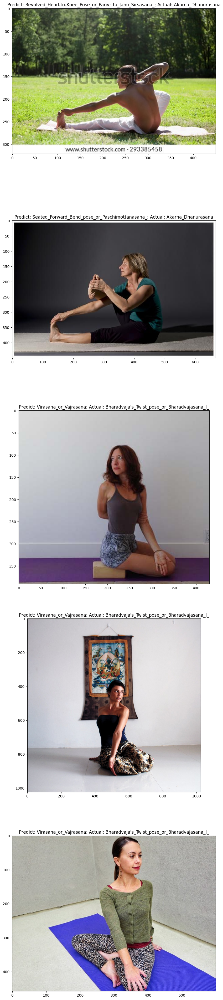

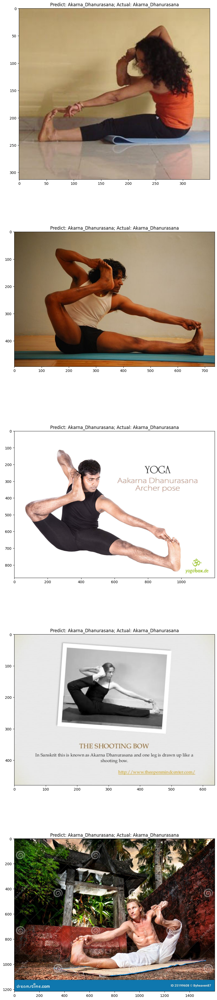

In [13]:
IMAGE_PER_ROW = 1
MAX_NO_OF_IMAGE_TO_PLOT = 5

# Extract the list of incorrectly predicted poses
false_predict = [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] != y_true_label[id_in_df]]
if len(false_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  false_predict = false_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the incorrectly predicted images
row_count = len(false_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(false_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(r'F:\unsw\COMP9444\Assignment2\dataset\split_yoga_data_png\yoga_test',
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

# Extract the list of correctly predicted poses
correct_predict = [id_in_df for id_in_df in range(len(y_test)) \
                   if y_pred_label[id_in_df] == y_true_label[id_in_df]]
if len(correct_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  correct_predict = correct_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the correctly predicted images
row_count = len(correct_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(correct_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(r'F:\unsw\COMP9444\Assignment2\dataset\split_yoga_data_png\yoga_test',
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

#### 4.4 Method 4: Xception

##### 4.4.1 Import Necessary Libraries
At first, the code imports many deep learning libraries. It uses TensorFlow and Keras as main framework, and also imports some helpful libraries like numpy for calculation and matplotlib for making pictures. These libraries are very important for project.

In [ ]:
# Model imports
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from scipy import ndimage
from keras.preprocessing.image import ImageDataGenerator
import plotly.express as px
import matplotlib.pyplot as plt
from keras import Sequential
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.models import load_model
from tensorflow.keras.applications import Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler

#####  4.4.2 Data and Model Setup
Then, we prepare data using ImageDataGenerator. we load training and validation data from folders. also make a function called lr_schedule to control learning rate - this is important for  training. The build_model function is using Xception model, which is very good at understanding pictures. The train_model function does training in two parts - first part only trains some layers, second part trains everything. This is good way for transfer learning.

In [ ]:
# Data Generator setup - with augmentation
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    validation_split=0.2,
    rescale=1. / 255
)

# Load data
root_path = r'C:\Users\Anderson\Documents\GitHub\COMP9444_project\Dataset\Yoga-82\yoga_dataset_links_skeleton'  # Update with your path
train_ds = data_gen.flow_from_directory(
    root_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='sparse',
    subset='training'
)

valid_ds = data_gen.flow_from_directory(
    root_path,
    target_size=(256, 256),
    batch_size=32,
    class_mode='sparse',
    subset='validation'
)

# Get number of classes
n_classes = len(train_ds.class_indices)


def lr_schedule(epoch):
    initial_lr = 0.001

    if epoch < 5:
        return initial_lr
    elif epoch < 15:
        return initial_lr * 0.5
    elif epoch < 30:
        return initial_lr * 0.1
    elif epoch < 50:
        return initial_lr * 0.05
    elif epoch < 70:
        return initial_lr * 0.01
    else:
        return initial_lr * 0.005


def build_model(trainable=False, learning_rate=0.001):
    base_model = Xception(
        include_top=False,
        weights='imagenet',
        input_shape=(256, 256, 3)
    )

    base_model.trainable = trainable

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(256, activation='relu'),
        Dropout(0.3),
        Dense(n_classes, activation='softmax')
    ])

    optimizer = Adam(learning_rate=learning_rate)

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


def train_model():
    # stage1
    print("Stage 1: Training top layers...")
    model = build_model(trainable=False, learning_rate=0.001)

    callbacks_stage1 = [
        EarlyStopping(
            monitor='val_accuracy',
            patience=10,
            restore_best_weights=True
        ),
        ModelCheckpoint(
            'yoga_pose_model_stage1.h5',
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )
    ]

    history1 = model.fit(
        train_ds,
        epochs=30,
        validation_data=valid_ds,
        callbacks=callbacks_stage1
    )

    # stage2
    print("\nStage 2: Fine-tuning the entire model...")
    model = build_model(trainable=True, learning_rate=0.0001)

    for layer in model.layers[0].layers[:-20]:
        layer.trainable = False

    callbacks_stage2 = [
        EarlyStopping(
            monitor='val_accuracy',
            patience=15,
            restore_best_weights=True
        ),
        ModelCheckpoint(
            'yoga_pose_model_stage2.h5',
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=7,
            min_lr=1e-7,
            verbose=1
        ),
        LearningRateScheduler(lr_schedule, verbose=1)
    ]

    history2 = model.fit(
        train_ds,
        epochs=70,
        validation_data=valid_ds,
        callbacks=callbacks_stage2
    )

    return model, history1, history2


Found 13145 images belonging to 82 classes.
Found 3250 images belonging to 82 classes.


#### 4.4.3 Visualization and Evaluation
Next part is about showing results. The plot_training_history function makes nice graphs to show how well model is learning. We can see accuracy and loss changing over time. The evaluate_model function checks how good our model is with test data. These functions help us understand if our model is working well.

In [ ]:

def plot_training_history(history1, history2):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
    plt.axvline(x=len(history1.history['accuracy']), color='g', linestyle='--', label='Stage Change')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b', label='Training Loss')
    plt.plot(epochs, val_loss, 'r', label='Validation Loss')
    plt.axvline(x=len(history1.history['loss']), color='g', linestyle='--', label='Stage Change')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


def evaluate_model(model, test_ds):
    print("\nEvaluating model...")
    test_loss, test_accuracy = model.evaluate(test_ds)
    print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
    print(f"Test Loss: {test_loss:.4f}")

    return test_loss, test_accuracy


Starting training process...
Number of classes: 82


#### 4.4.4 Main Execution
Final part puts everything together. It starts training, makes pictures of results, checks how good model is, and saves model for later use. It also prints important numbers like how many times it trained and how accurate it is. This part shows if our hard work was successful.
All these parts work together to make a model that can recognize different yoga poses from pictures. The code uses many good techniques from deep learning field, like transfer learning and data augmentation. This makes the model learn better and work better with new pictures it hasn't seen before.

In [ ]:
if __name__ == "__main__":
    print("Starting training process...")
    print(f"Number of classes: {n_classes}")

    model, history1, history2 = train_model()

    plot_training_history(history1, history2)

    final_loss, final_accuracy = evaluate_model(model, valid_ds)

    model_save_path = 'yoga_pose_model_final.h5'
    model.save(model_save_path)
    print(f"\nModel saved to {model_save_path}")

    print("\nTraining Summary:")
    print(f"Total epochs trained: {len(history1.history['accuracy']) + len(history2.history['accuracy'])}")
    print(
        f"Best validation accuracy: {max(history1.history['val_accuracy'] + history2.history['val_accuracy']) * 100:.2f}%")
    print(f"Final validation accuracy: {final_accuracy * 100:.2f}%")

Stage 1: Training top layers...
Epoch 1/30
411/411 [==============================] - ETA: 0s - loss: 3.8761 - accuracy: 0.1092
Epoch 1: val_accuracy improved from -inf to 0.23569, saving model to yoga_pose_model_stage1.h5
411/411 [==============================] - 225s 537ms/step - loss: 3.8761 - accuracy: 0.1092 - val_loss: 3.2156 - val_accuracy: 0.2357 - lr: 0.0010
Epoch 2/30
411/411 [==============================] - ETA: 0s - loss: 3.2308 - accuracy: 0.2096
Epoch 2: val_accuracy improved from 0.23569 to 0.28892, saving model to yoga_pose_model_stage1.h5
411/411 [==============================] - 298s 725ms/step - loss: 3.2308 - accuracy: 0.2096 - val_loss: 2.8166 - val_accuracy: 0.2889 - lr: 0.0010
Epoch 3/30
411/411 [==============================] - ETA: 0s - loss: 3.0041 - accuracy: 0.2483
Epoch 3: val_accuracy improved from 0.28892 to 0.33169, saving model to yoga_pose_model_stage1.h5
411/411 [==============================] - 260s 632ms/step - loss: 3.0041 - accuracy: 0.2483 


Evaluating model...
102/102 [==============================] - 29s 279ms/step - loss: 0.9474 - accuracy: 0.7843
Test Accuracy: 78.43%
Test Loss: 0.9474

Model saved to yoga_pose_model_final.h5

Training Summary:
Total epochs trained: 65
Best validation accuracy: 79.69%
Final validation accuracy: 78.43%


#### 4.5 Method 5: DenseNet201

##### 4.5.1 Import Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
# from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from keras_preprocessing.image import ImageDataGenerator

from sklearn.metrics import classification_report, log_loss, accuracy_score
from sklearn.model_selection import train_test_split

##### 4.5.2 Specifies the path to the directory where the training data set resides

In [ ]:
train_dir = r'autodl-tmp/yoga_dataset_links'

##### 4.5.3 Add files to Name and print the total

In [ ]:
Name=[]
for file in os.listdir(train_dir):
    Name+=[file]
# print(Name)
print(len(Name))

82


##### 4.5.4 Establish two mapping relationships

In [ ]:
N=[]
for i in range(len(Name)):
    N+=[i]
    
normal_mapping=dict(zip(Name,N)) 
reverse_mapping=dict(zip(N,Name)) 

def mapper(value):
    return reverse_mapping[value]

##### 4.5.5 Scale the data set

In [ ]:
train_ratio = 0.7
val_ratio = 0.15

dataset = []   # Training set
valset = []    # Validation set
testset = []   # Test set
count = 0      # Used to record category indexes

for file in os.listdir(train_dir):
    t = 0  # Used to count the number of images per category
    path = os.path.join(train_dir, file)
    total_images = len(os.listdir(path))  # The total number of images for the current category
    train_limit = int(total_images * train_ratio)  # Limit the number of training sets
    val_limit = train_limit + int(total_images * val_ratio)  # Validation sets limit the number of sets
    
    for im in os.listdir(path):
        try:
            image = load_img(os.path.join(path, im), color_mode='rgb', target_size=(224, 224))
            image = img_to_array(image) / 255.0  # normalization
            
            # Scale the data set
            if t < train_limit:
                dataset += [[image, count]]
            elif t < val_limit:
                valset += [[image, count]]
            else:
                testset += [[image, count]]
            t += 1
        except OSError:
            print(f"Skipping truncated or unreadable image: {im}")
    
    count += 1  # Update category index

/root/miniconda3/lib/python3.8/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/PIL/TiffImagePlugin.py:845: UserWarning: Truncated File Read
  warnings.warn(str(msg))


Skipping truncated or unreadable image: 1_56.jpg
Skipping truncated or unreadable image: 2_606.jpg


##### 4.5.6 Separate data from labels

In [ ]:
train_data, train_labels = zip(*dataset)
val_data, val_labels = zip(*valset)
test_data, test_labels = zip(*testset)

##### 4.5.7 Conversion format

In [ ]:
# Image data is converted to NumPy array
train_data = np.array(train_data)
val_data = np.array(val_data)
test_data = np.array(test_data)
# Label conversion to One-Hot encoding
train_labels = to_categorical(train_labels)
val_labels = to_categorical(val_labels)
test_labels = to_categorical(test_labels)

##### 4.5.8 Prints the shapes of the three sets

In [ ]:
print("Training set:", train_data.shape, "Validation set:", val_data.shape, "Test set:", test_data.shape)

Training set: (12983, 224, 224, 3) Validation set: (2748, 224, 224, 3) Test set: (2867, 224, 224, 3)


##### 4.5.9 Data enhancement

In [ ]:
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=40,
                             zoom_range=0.3, width_shift_range=0.3, height_shift_range=0.3,
                             shear_range=0.2, fill_mode="nearest")

##### 4.5.10 Pre-train and fine-tune layers

In [ ]:
pretrained_model3 = tf.keras.applications.DenseNet201(input_shape=(224,224,3),include_top=False,weights='imagenet',pooling='avg')
pretrained_model3.trainable = False

# Set the model to trainable and select partial layer fine-tuning
pretrained_model3.trainable = True
for layer in pretrained_model3.layers[:100]:  # Freeze the first 100 layers
    layer.trainable = False

2024-11-14 10:18:10.890644: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-14 10:18:11.717167: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22310 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:e1:00.0, compute capability: 8.6


##### 4.5.11 Load the pre-trained DenseNet201 model and add dropout

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


# Model definition part
inputs3 = pretrained_model3.input
x3 = tf.keras.layers.Dense(128, activation='relu')(pretrained_model3.output)
x3 = tf.keras.layers.Dropout(0.5)(x3)  # Add 30% Dropout
outputs3 = tf.keras.layers.Dense(82, activation='softmax')(x3)
model = tf.keras.Model(inputs=inputs3, outputs=outputs3)

Num GPUs Available:  1


##### 4.5.12 Compilation model

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), 
              loss='categorical_crossentropy', metrics=['accuracy'])

##### 4.5.13 Define callback functions and train the model

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define EarlyStopping and ModelCheckpoint callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)

# Train with the new dataset variable name
his = model.fit(datagen.flow(train_data, train_labels, batch_size=32), 
                validation_data=(val_data, val_labels),
                epochs=50, callbacks=[early_stop, checkpoint])

Epoch 1/50


2024-11-14 10:20:13.118296: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8101
2024-11-14 10:20:16.177011: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


406/406 [==============================] - 139s 296ms/step - loss: 4.5641 - accuracy: 0.0164 - val_loss: 4.3198 - val_accuracy: 0.0408
Epoch 2/50
406/406 [==============================] - 113s 278ms/step - loss: 4.3484 - accuracy: 0.0302 - val_loss: 4.1769 - val_accuracy: 0.0633
Epoch 3/50
406/406 [==============================] - 113s 277ms/step - loss: 4.2223 - accuracy: 0.0572 - val_loss: 3.9437 - val_accuracy: 0.1157
Epoch 4/50
406/406 [==============================] - 115s 283ms/step - loss: 4.0637 - accuracy: 0.0871 - val_loss: 3.6482 - val_accuracy: 0.1754
Epoch 5/50
406/406 [==============================] - 113s 277ms/step - loss: 3.8806 - accuracy: 0.1188 - val_loss: 3.3625 - val_accuracy: 0.2580
Epoch 6/50
406/406 [==============================] - 117s 289ms/step - loss: 3.7010 - accuracy: 0.1617 - val_loss: 3.0847 - val_accuracy: 0.3122
Epoch 7/50
406/406 [==============================] - 113s 279ms/step - loss: 3.5241 - accuracy: 0.1966 - val_loss: 2.8683 - val_accura

### **5. Results**


##### 5.1 Load model and run test dataset

##### Model 1: CNN + MobileNetV3

In [17]:
# Load the model
model1 = tf.keras.models.load_model("yoga_classification_complete_model.h5")
print("load complete")

load complete


In [18]:
results = model1.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

d:\Anaconda\envs\CVNN\lib\site-packages\PIL\Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
d:\Anaconda\envs\CVNN\lib\site-packages\PIL\TiffImagePlugin.py:900: UserWarning: Truncated File Read
  warnings.warn(str(msg))


    Test Loss: 1.12678
Test Accuracy: 72.66%


##### Model 2: 3D CNN + MediaPipe

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
model = YogaConv3d(num_classes=num_classes)
model.load_state_dict(torch.load('model_checkpoint_1121_141124.pth'))
model.to(device)

model.eval()  # Set the model to evaluation mode
# Collect predictions and labels
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)  # Get the predicted class
        all_preds.extend(preds.cpu().numpy())  # Store predictions
        all_labels.extend(labels.cpu().numpy())  # Store true labels
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

Accuracy: 77.29%
Precision: 78.58%
Recall: 77.29%
F1 Score: 77.29%


##### Model 3: MoveNet


In [ ]:
model = tf.keras.models.load_model("my_model.h5")
print("load complete")

results = model.evaluate(X_test, y_test, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

load complete
    Test Loss: 0.56697
Test Accuracy: 88.22%


##### Model 4: Xception

In [ ]:
# Load model
model = tf.keras.models.load_model("yoga_pose_model_final.h5") 
print("Model loaded successfully")

Model loaded successfully


In [ ]:
 print("\nTraining Summary:")
    print(f"Total epochs trained: {len(history1.history['accuracy']) + len(history2.history['accuracy'])}")
    print(
        f"Best validation accuracy: {max(history1.history['val_accuracy'] + history2.history['val_accuracy']) * 100:.2f}%")
    print(f"Final validation accuracy: {final_accuracy * 100:.2f}%")


Evaluating model...
102/102 [==============================] - 29s 279ms/step - loss: 0.9474 - accuracy: 0.7843
Test Accuracy: 78.43%
Test Loss: 0.9474

Model saved to yoga_pose_model_final.h5

Training Summary:
Total epochs trained: 65
Best validation accuracy: 79.69%
Final validation accuracy: 78.43%


##### Model 5: DenseNet201

In [ ]:
# Load the model
model1 = tf.keras.models.load_model("best_model_last.h5")
print("load complete")

load complete


In [ ]:
results = model1.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

d:\Anaconda\envs\CVNN\lib\site-packages\PIL\Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
d:\Anaconda\envs\CVNN\lib\site-packages\PIL\TiffImagePlugin.py:900: UserWarning: Truncated File Read
  warnings.warn(str(msg))


    Test Loss: 0.81632
Test Accuracy: 79.00%


##### 5.2 Visualizing loss curves

Loss curves are used to visualize the model's learning progress during training by plotting the training and validation loss over epochs. They help identify underfitting, overfitting, or convergence issues, providing insights to adjust hyperparameters or the training process.

##### Model 1: CNN + MobileNetV3

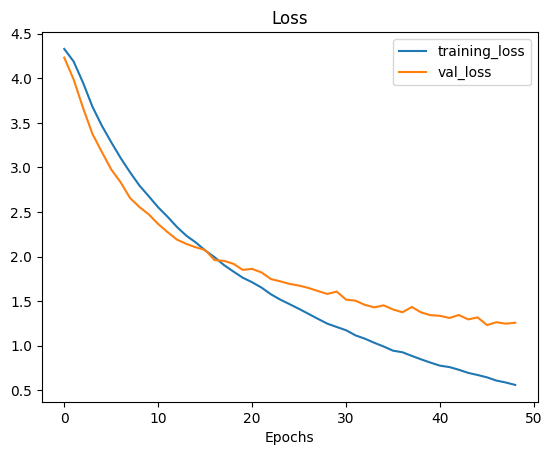

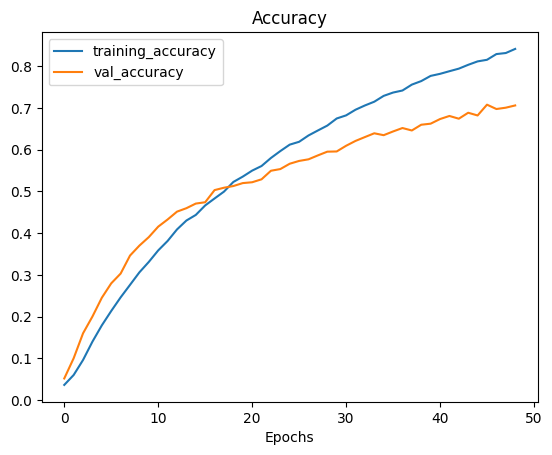

In [26]:
plot_loss_curves(history)

##### Model 2: 3D CNN + MediaPipe

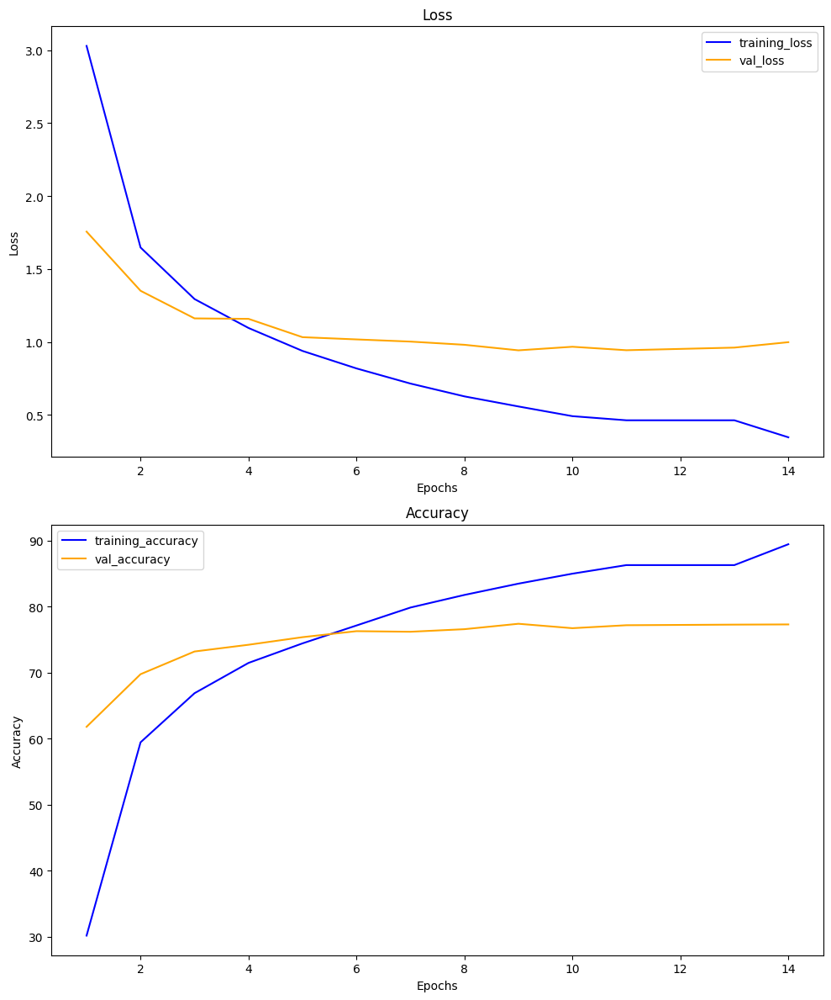

In [ ]:
import re
import matplotlib.pyplot as plt

log_file_path = r'D:\Term 3 2024\COMP9444\COMP9444_project\Dataset\Yoga-82\Renhua code\temp.txt'

# Step 2: Use regular expressions to extract metrics for each epoch
epochs = []
training_losses = []
validation_losses = []
training_accuracies = []
validation_accuracies = []

# Regular expression patterns
epoch_pattern = re.compile(r"Epoch (\d+)")
train_loss_pattern = re.compile(r"Training - Loss: ([\d.]+), Accuracy: ([\d.]+)%")
val_loss_pattern = re.compile(r"Validation - Loss: ([\d.]+), Accuracy: ([\d.]+)%")

with open(log_file_path, 'r') as file:
    for line in file:
        epoch_match = epoch_pattern.search(line)
        train_loss_match = train_loss_pattern.search(line)
        val_loss_match = val_loss_pattern.search(line)
        
        # Append data if matches are found
        if epoch_match:
            epochs.append(int(epoch_match.group(1)))
        if train_loss_match:
            training_losses.append(float(train_loss_match.group(1)))
            training_accuracies.append(float(train_loss_match.group(2)))
        if val_loss_match:
            validation_losses.append(float(val_loss_match.group(1)))
            validation_accuracies.append(float(val_loss_match.group(2)))

# Step 3: Plot the data
plt.figure(figsize=(10, 12))

# Plot Loss
plt.subplot(2, 1, 1)
plt.plot(epochs, training_losses, label="training_loss", color="blue")
plt.plot(epochs, validation_losses, label="val_loss", color="orange")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss")
plt.legend()

# Plot Accuracy
plt.subplot(2, 1, 2)
plt.plot(epochs, training_accuracies, label="training_accuracy", color="blue")
plt.plot(epochs, validation_accuracies, label="val_accuracy", color="orange")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()


##### Model 3: MoveNet

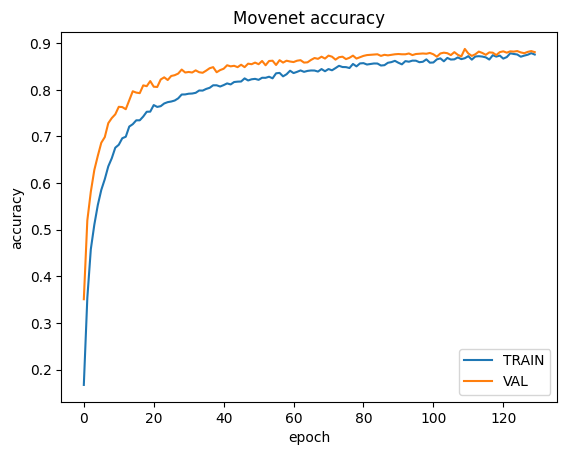

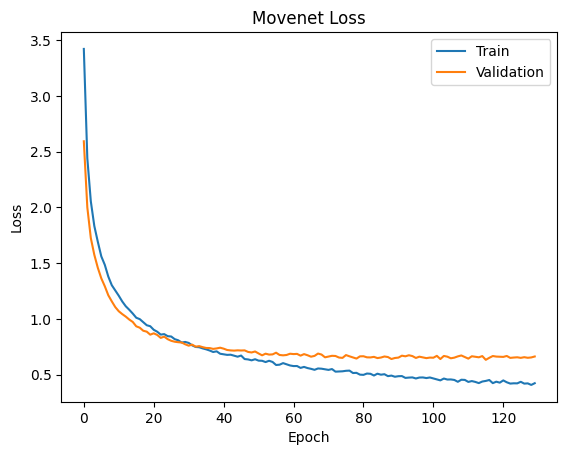

90/90 [==============================] - 0s 506us/step - loss: 0.5516 - accuracy: 0.8808


In [11]:
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(X_val, y_val),
                    callbacks=[checkpoint, earlystopping])

# Visualize the training history to see whether you're overfitting.

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Movenet accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Movenet Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

##### Model 4: Xception

In the Xception model training process, we set the first training cycle to be 30 epochs and second training cycle to be 70 epochs (although it may not reach 70th epoch because of the early stopping). 

Becaue we set 2 training cycles, so after the first cycle (30th epochs), the accuracy declines drametically and loss increased strongly as well.

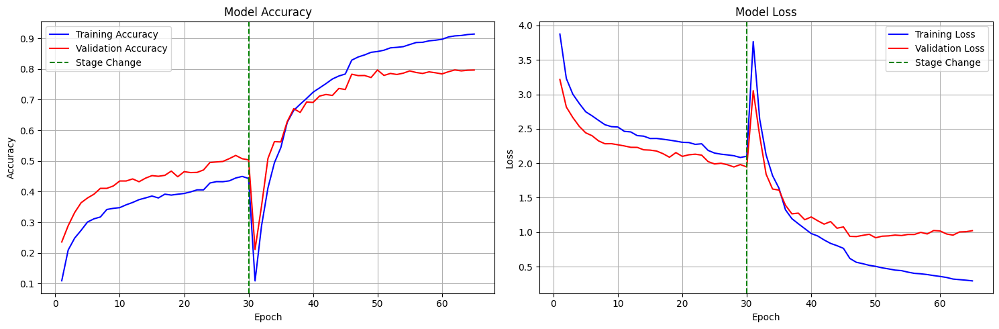

In [ ]:
def plot_training_curves():
    # Loss
    plt.figure(figsize=(8, 6))
    plt.plot(history['loss'], label='training_loss')
    plt.plot(history['val_loss'], label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Accuracy
    plt.figure(figsize=(8, 6))
    plt.plot(history['accuracy'], label='training_accuracy')
    plt.plot(history['val_accuracy'], label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

try:
    history = np.load('training_history.npy', allow_pickle=True).item()
    plot_training_curves()
except:
    print("Training history file not found")

##### Model 5: DenseNet201

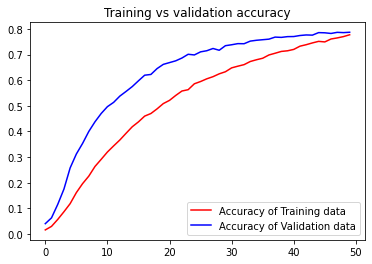

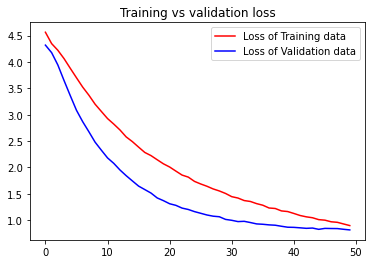

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_loss_curves(history)

##### Making predictions on the test data

In [20]:
# Predict the label of the test_images
pred = model1.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

The first 5 predictions: ['Gate_Pose_or_Parighasana_', 'Split pose', 'Standing_big_toe_hold_pose_or_Utthita_Padangusthasana', 'Legs-Up-the-Wall_Pose_or_Viparita_Karani_', 'Plow_Pose_or_Halasana_']


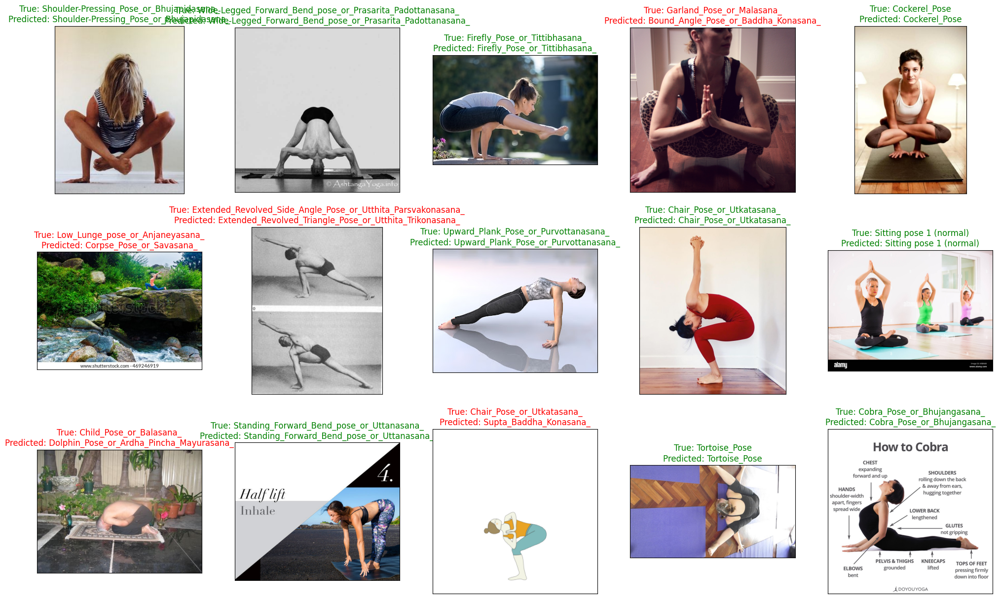

<Figure size 640x480 with 0 Axes>

In [28]:
  # Display 15 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
      color = "green"
    else:
      color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

##### 5.3 Plotting the classification reports and confusion matrix

A confusion matrix is a tabular representation of a model's classification performance, showing the counts of true positives, true negatives, false positives, and false negatives. It provides a detailed breakdown of prediction accuracy for each class, aiding in the identification of misclassification patterns.

<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The test dataset will be used to assess the model's performance. Accuracy is a key metric which measures the proportion of correct predictions made by the model. Additional evaluation metrics include the following:   </p>

<h3>Precision(P):</h3> 
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">Precision represents the proportion of true positive predictions (TP) out of all relevant results, including false positives (FP). In multi-class classification tasks, precision is averaged across all classes.</p>

<h4> <center>$P=TP/(TP+FP)$</center></h4> 

<h3>Recall(R): </h3> 
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">Recall indicates the proportion of true positives (TP) out of the total true positives and false negatives (FN). For multi-class problems, recall is also averaged across classes.</p>
<h4><center>$R=TP/(TP+FN)$</center></h4>

<h3>F1 score(F1): </h3>

<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The F1 score is the harmonic mean of precision and recall, providing a balanced measure of the two metrics. For multi-class classification, the F1 score is averaged across all classes.</p>
<h4><center>$F1=2 * (TP * FP)/(TP+FP)$</center></h4>

##### Model 1: CNN + MobileNetV3

In [29]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

                                                                           precision    recall  f1-score   support

                                                       Akarna_Dhanurasana       0.57      0.69      0.63        39
                             Bharadvaja's_Twist_pose_or_Bharadvajasana_I_       0.70      0.19      0.30        36
                                         Boat_Pose_or_Paripurna_Navasana_       0.74      0.75      0.75       161
                                     Bound_Angle_Pose_or_Baddha_Konasana_       0.71      0.58      0.64        91
                                                 Bow_Pose_or_Dhanurasana_       0.71      0.83      0.76        81
                                 Bridge_Pose_or_Setu_Bandha_Sarvangasana_       0.83      0.72      0.77       103
                                                 Camel_Pose_or_Ustrasana_       0.76      0.84      0.80       129
                                            Cat_Cow_Pose_or_Marjaryasana_      

,precision,recall,f1-score,support
Akarna_Dhanurasana,0.574468,0.692308,0.627907,39.000000
Bharadvaja's_Twist_pose_or_Bharadvajasana_I_,0.700000,0.194444,0.304348,36.000000
Boat_Pose_or_Paripurna_Navasana_,0.742331,0.751553,0.746914,161.000000
Bound_Angle_Pose_or_Baddha_Konasana_,0.706667,0.582418,0.638554,91.000000
Bow_Pose_or_Dhanurasana_,0.705263,0.827160,0.761364,81.000000
...,...,...,...,...
Yogic_sleep_pose,0.611111,0.333333,0.431373,33.000000
viparita_virabhadrasana_or_reverse_warrior_pose,0.607143,0.485714,0.539683,35.000000
accuracy,0.707392,0.707392,0.707392,0.707392
macro avg,0.698809,0.666294,0.673781,7440.000000


##### Model 2: 3D CNN + MediaPipe


Analysis: 

- Accuracy: 77.29% shows that the model correctly classifies yoga poses approximately 77% of the time.
- Precision: 78.58% reflects the proportion of correctly predicted positive observations among all predictions of a class.
- Recall: 77.29% measures the model's ability to identify all actual positive observations for each yoga pose class.
- F1 Score: 77.29% is the harmonic mean of precision and recall, showing a balance between them.

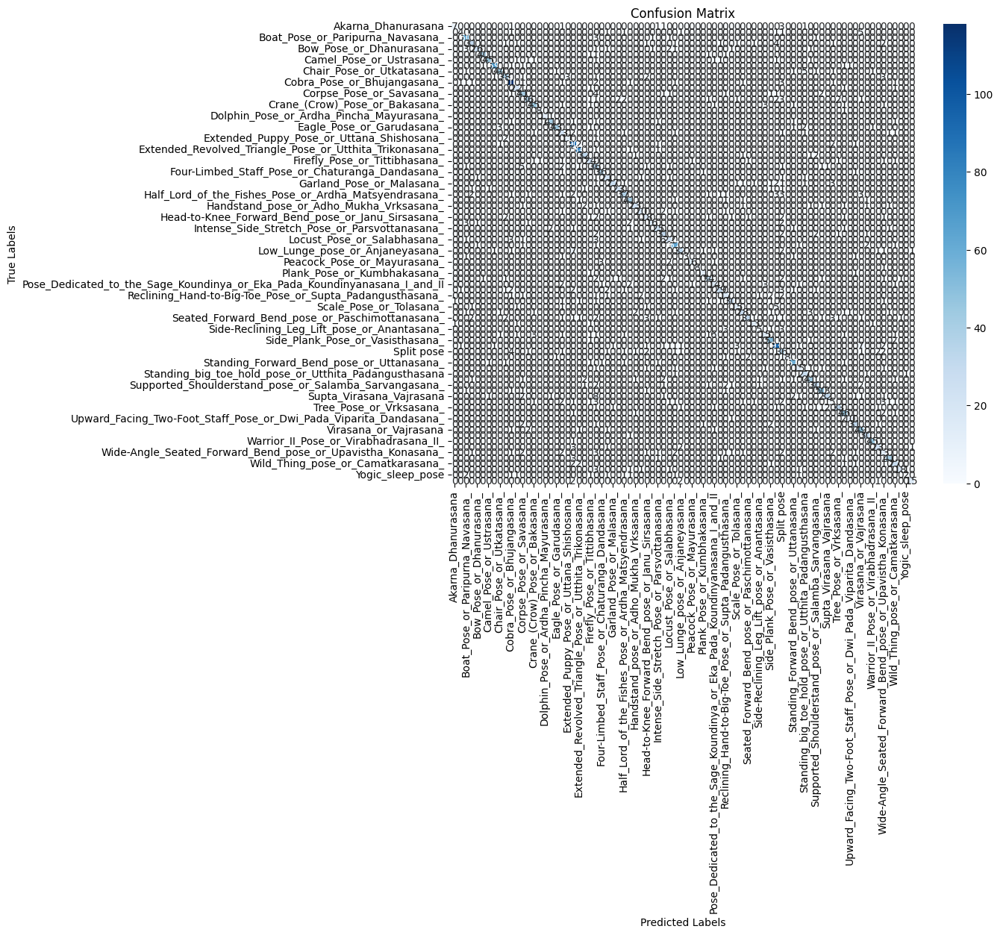

In [ ]:
from sklearn.metrics import classification_report
import seaborn as sns

index_to_class = {v: k for k, v in train_dataset.class_to_idx.items()}
# Assuming `all_labels` are the true labels and `all_preds` are the predicted labels
class_names = [index_to_class[i] for i in range(num_classes)]

# Generate confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Create a DataFrame for the confusion matrix
confusion_matrix_df = pd.DataFrame(cm, index=class_names, columns=class_names)


# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix_df, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("True Labels")
plt.xlabel("Predicted Labels")
plt.show()

##### Model 3: Movenet


In [12]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  """Plots the confusion matrix."""
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=55)
  plt.yticks(tick_marks, classes)
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()

# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_test)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')


# Print the classification report
print('\nClassification Report:\n', classification_report(y_true_label, y_pred_label))

Confusion matrix, without normalization


C:\Users\15053\AppData\Local\Temp\ipykernel_31072\932516845.py:27: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()



Classification Report:
                                                                            precision    recall  f1-score   support

                                                       Akarna_Dhanurasana       1.00      0.78      0.88         9
                             Bharadvaja's_Twist_pose_or_Bharadvajasana_I_       0.78      0.70      0.74        10
                                         Boat_Pose_or_Paripurna_Navasana_       0.88      0.90      0.89        62
                                     Bound_Angle_Pose_or_Baddha_Konasana_       0.88      0.88      0.88        42
                                                 Bow_Pose_or_Dhanurasana_       0.94      0.97      0.96        33
                                 Bridge_Pose_or_Setu_Bandha_Sarvangasana_       0.95      0.93      0.94        42
                                                 Camel_Pose_or_Ustrasana_       0.98      0.94      0.96        52
                                            Cat_Cow_Po

##### Model 4: Xception

In [ ]:
    plt.figure(figsize=(15, 15))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


Classification Report:
                                                                            precision    recall  f1-score   support

Akarna_Dhanurasana                                                             0.688    0.786    0.733       14
Bharadvaja's_Twist_pose_or_Bharadvajasana_I_                                   0.300    0.429    0.353       14
Boat_Pose_or_Paripurna_Navasana_                                               0.887    0.723    0.797       65
Bound_Angle_Pose_or_Baddha_Konasana_                                           0.698    0.682    0.690       44
Bow_Pose_or_Dhanurasana_                                                       0.935    0.806    0.866       36
Bridge_Pose_or_Setu_Bandha_Sarvangasana_                                       0.897    0.795    0.843       44
Camel_Pose_or_Ustrasana_                                                       1.000    0.827    0.905       52
Cat_Cow_Pose_or_Marjaryasana_                                              

##### Model 5: DenseNet201

In [ ]:
y_pred = model.predict(test_data)
pred = np.argmax(y_pred, axis=1)
ground = np.argmax(test_labels, axis=1)

# Generate classification reports using class names
print(classification_report(ground, pred, target_names=Name))

90/90 [==============================] - 4s 44ms/step
                                                                           precision    recall  f1-score   support

                                                       Akarna_Dhanurasana       1.00      0.79      0.88        14
                             Bharadvaja's_Twist_pose_or_Bharadvajasana_I_       0.67      0.17      0.27        12
                                         Boat_Pose_or_Paripurna_Navasana_       0.81      0.88      0.84        57
                                     Bound_Angle_Pose_or_Baddha_Konasana_       0.72      0.79      0.76        39
                                                 Bow_Pose_or_Dhanurasana_       0.87      0.79      0.83        33
                                 Bridge_Pose_or_Setu_Bandha_Sarvangasana_       0.88      0.90      0.89        39
                                                 Camel_Pose_or_Ustrasana_       0.88      0.89      0.88        47
                         

/root/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/root/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/root/miniconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##### 5.4 Grad-Cam Visualization

Grad-CAM (Gradient-weighted Class Activation Mapping) generates a heatmap to highlight the regions in an image that the model focused on to make a decision. It is a powerful tool for model interpretability, allowing visualization of which parts of an image contribute most to a specific prediction. 

<br>

Working Principle of Grad-CAM

1. **Input Image**: An input image is passed through a trained CNN.


2. **Gradient Calculation**: Grad-CAM computes the gradient of the predicted class score with respect to the feature maps of the last convolutional layer. This highlights which spatial features contribute most to the prediction.


3. **Weighted Feature Maps**:

    3.1 The gradients are averaged (pooled) spatially to obtain a weight for each feature map channel.

    3.2 These weights reflect the importance of each feature map in predicting the target class.



4. **Heatmap Generation**:

    4.1 The weighted combination of the feature maps is calculated.

    4.2 This result is passed through a ReLU function to keep only positive contributions, producing a coarse heatmap.


5. **Overlaying the Heatmap**:

    5.1 The heatmap is resized to match the input image dimensions and overlaid on the image, showing the regions the model considered important.

<br>

We implement this map since The Grad-CAM helps us to

1. allowing researchers to understand the **key areas** that the model focuses on;

2. Discover whether the model has **bias**, such as focusing on areas that are not related to classification;

3. also allowing users to **more intuitively see** how the model "sees" the image




##### Model 1: CNN + MobileNetV3

C:\Users\klaus\AppData\Local\Temp\ipykernel_14048\892203968.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


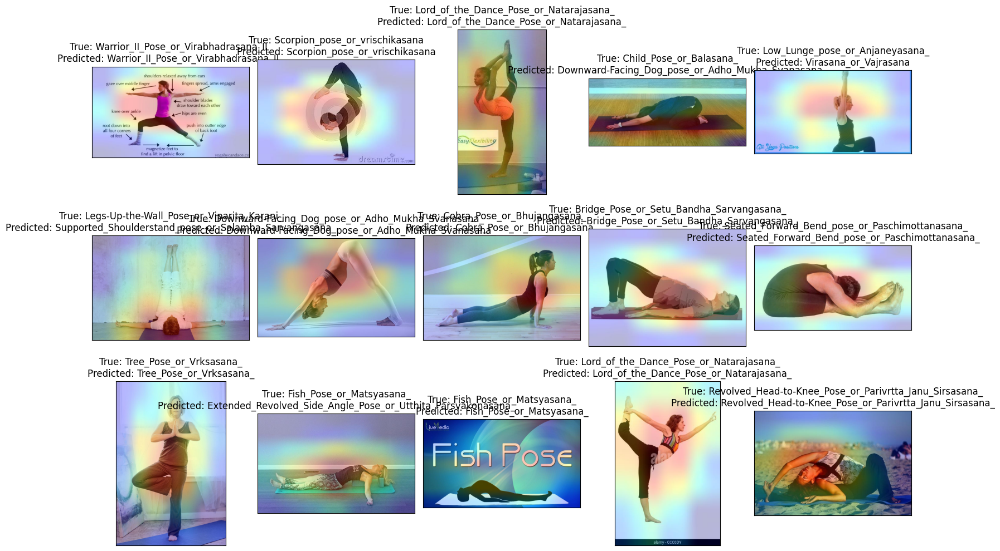

In [23]:
def get_img_array(img_path, size=(224, 224)):
    # Load the image and resize it
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # Add a dimension to convert the image into batch size
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Create a model that maps the input image to the activations of the last convolutional layer and the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Compute the gradient of the input image
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    
    # Compute the gradient of the class channel with respect to the feature map of the last convolutional layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Get the average value of gradients for each feature channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Generate the heatmap
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Scale the heatmap to the range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use the jet colormap to colorize the heatmap
    jet = cm.get_cmap("jet")

    # Get RGB values
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Convert the colored heatmap to an image
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Overlay the heatmap on the original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    
    # Save and return the overlaid image
    superimposed_img.save(cam_path)
    return cam_path

# Configure preprocessing for the model
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

# Set the name of the last convolutional layer and image size
last_conv_layer_name = "Conv_1"  # Update with the actual last convolutional layer name
img_size = (224, 224)

# Remove the softmax from the last layer
model = tf.keras.applications.MobileNetV2(weights="imagenet", include_top=True)
model.layers[-1].activation = None

# Randomly select images from the test dataset and generate Grad-CAM
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10), subplot_kw={'xticks': [], 'yticks': []})
random_index = random.sample(range(len(test_df)), 15)  # Assume test_df is your test dataset DataFrame

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}")

plt.tight_layout()
plt.show()

##### Model 5: DenseNet201

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_27620\1352633833.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")
d:\anaconda\envs\densenet\lib\site-packages\PIL\Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


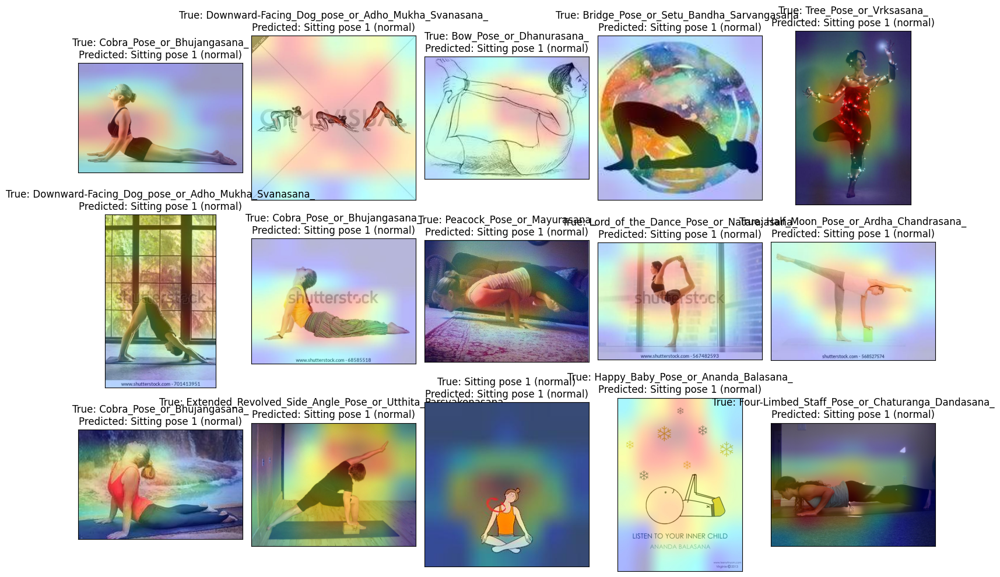

In [ ]:
plt.tight_layout()
plt.show()

##### 5.5 Accuracy comparison between models

Among all 5 models in our group, MoveNet got highest test accuracy which is 88.22 while CNN + MobileNetV3 got the lowest test accuracy which is 72.67, the ranking of these models' accuracy is :

    1.  MoveNet - 88.22

    2. Xception - 79.63

    3. DenseNet201 - 79.00

    4. 3D CNN + MediaPipe - 77.29

    5. CNN + MobileNetV3 - 72.67


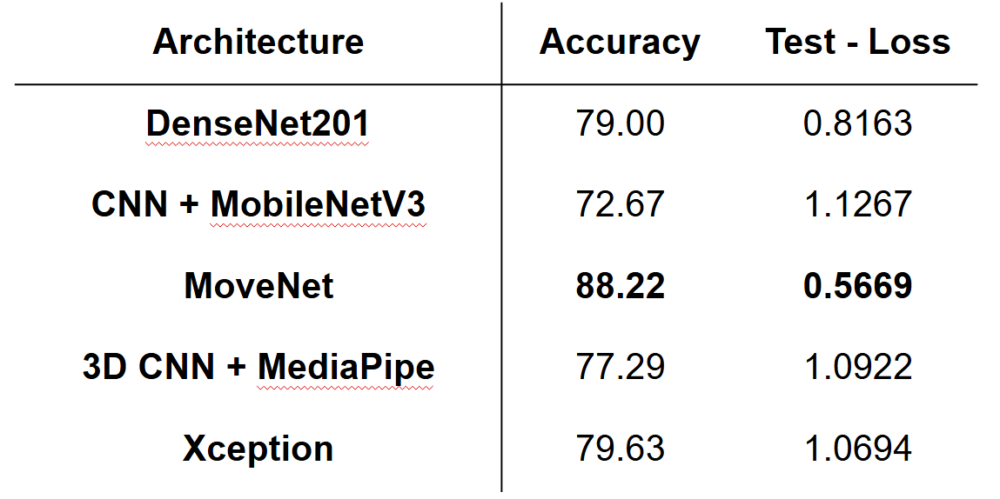

In [9]:
import base64
from IPython.display import HTML, display

# Function to encode an image as Base64
def embed_image_base64(image_path):
    # Read the image in binary mode
    with open(image_path, "rb") as image_file:
        # Encode the image to Base64
        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
    # Create an HTML string to display the image
    html_code = f'<img src="data:image/jpeg;base64,{encoded_string}" width="900"/>'
    return html_code

# Path to your image
image_path = "accuracy_comparison.png"  # Replace with your image path

# Embed and display the image
html_code = embed_image_base64(image_path)
display(HTML(html_code))

##### 5.6 The three classes with the highest precision in each model

In this page, we will take a look at the best 3 prediction classes in each model.
We can see whatever the model we chose, we always have some common classes that have high accuracy

1. the highest precision of common class belongs to **Extended Puppy Pose**, it got **100 percent** in both **MoveNet** and **Xception**

2. The second one is the **Yogic sleep pose** which has **100 percent** precision in both **DenseNet201** and **MoveNet**

3. The next one goes to the **Extended Revolved Triangle**, it got **94 percent** in **CNN + MobileNetV3** and **97 Percent** in **Xception**

4. The last one is the **Warriror two pose** which got **98 percent** in **DenseNet201** and **94 percent** in **CNN + MobileNetV3**



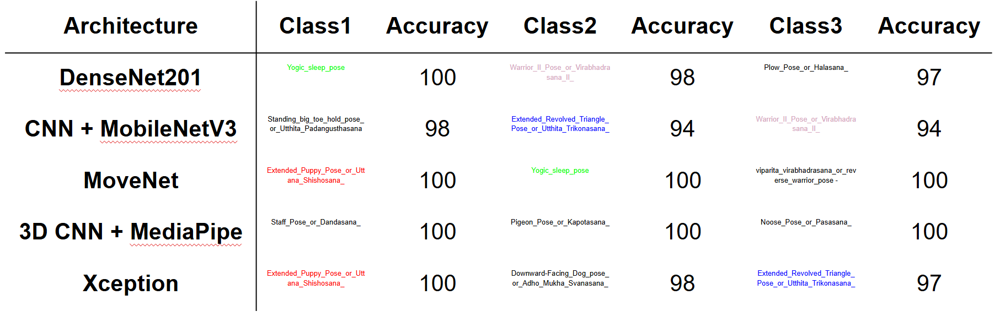

In [11]:
# Function to encode an image as Base64
def embed_image_base64(image_path):
    # Read the image in binary mode
    with open(image_path, "rb") as image_file:
        # Encode the image to Base64
        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
    # Create an HTML string to display the image
    html_code = f'<img src="data:image/jpeg;base64,{encoded_string}" width="2000"/>'
    return html_code

# Path to your image
image_path = "3best_classes.png"  # Replace with your image path

# Embed and display the image
html_code = embed_image_base64(image_path)
display(HTML(html_code))

### **6. Evaluation**

##### 6.1 Evaluation Methods

As I discussed in the previous section, we use loss curves, test accuracy, confusion matrix, Grad-Cam visualization to help evaluting the all 5 models. I will briefly discuss in this section about how we evalute models through these methods.

1. **Loss Curves:**
Loss curves provide insights into the model's learning behavior over training epochs. By observing the trend of training and validation loss, we can determine:
    - Whether the model is overfitting (large gap between training and validation loss).
    - Underfitting or instability (loss does not converge or fluctuates significantly).
    - Appropriate training progression (steady decrease in both losses).

    For each model, we analyze the curves to compare their convergence rates and generalization performance.

2. **Test Accuracy:**
Test accuracy is a direct metric to quantify how well a model performs on unseen data. It provides an overall measure of classification success. By comparing test accuracy across all five models, we can determine which model achieves the highest predictive performance and generalizes best to new samples.

3. **Confusion Matrix:**
A confusion matrix helps in understanding the detailed prediction performance of the models by breaking down predictions for each class. Key metrics derived include:
    - True Positive Rate (Recall)
    - Precision
    - F1-score (harmonic mean of precision and recall).
    - Support

    This is especially useful in datasets with imbalanced classes, such as the Yoga-82 dataset, where some classes may have fewer samples. We analyze these matrices to identify which models handle class-specific predictions most effectively.

4. **Grad-CAM Visualization:**
Grad-CAM (Gradient-weighted Class Activation Mapping) visualizations highlight regions of input images that contribute the most to a model’s decision. These heatmaps provide an interpretability layer to evaluate:
    - Whether the model focuses on relevant features in the image.
    - Possible areas where the model is prone to incorrect focus (e.g., background noise).
    - By applying Grad-CAM to the models, we gain a qualitative understanding of their feature extraction capabilities and decision-making process.

Through this multi-faceted evaluation framework, we are able to assess not only the quantitative performance of the models but also their interpretability and robustness, enabling a comprehensive comparison across all five models.



### **7. Discussion**
##### 7.1 Loss and Accuracy

These charts illustrate the training and validation loss and accuracy over epochs for different models.
1. **Training Accuracy** (MovNet vs. MobileNetV3): The MovNet model converges faster on the training set, 
2. **Validation Accuracy** (MovNet vs. MobileNetV3): MovNet’s validation accuracy reaches near convergence at earlier epochs, indicating good generalization to new data.
3. **Training Loss** (MovNet vs. MobileNetV3): MovNet’s training loss drops quickly and stabilizes, demonstrating high learning efficiency
4. **MoveNet**: Reaches high accuracy quickly with stable training, showing lower validation loss, indicating a well-generalized model.
5. **MobileNetV3**: Moderate accuracy increase over epochs, with a relatively stable gap between training and validation accuracy.
6. **DenseNet201**: Strong improvement in accuracy but shows a higher validation loss than other models, possibly indicating overfitting.
7. **3DCNN + MediaPipe**: Similar performance to MobileNetV3 with steady accuracy growth; validation loss converges with training loss, suggesting good generalization for posture recognition.

In summary, MoveNet demonstrate better generalization capabilities and lower validation loss, making it preferable choices for selection. The other models also perform well but may require further adjustments to optimize their validation performance.

##### 7.2 Performance Analysis


1. **MobileNetV3 vs MoveNet-based Pose Model**：MobileNetV3 is compact for mobile use but less precise in posture classification than MoveNet, which excels at real-time keypoint detection.

2. **CNN+MediaPipe**: Offers versatile and accurate posture classification through effective keypoint detection, suitable for general pose estimation tasks

3. **Xception vs DenseNet201**：Xception is efficient for general classification, whereas DenseNet201 captures complex postures better but isn’t suitable for real-time use.

4. **MoveNet-based Pose Model vs Xception & DenseNet201**：MoveNet is ideal for keypoint-based posture tracking, while Xception and DenseNet201 are better suited for traditional classification tasks.

5. **MobileNetV3 vs CNN+MediaPipe**: MobileNetV3 is good for general lightweight tasks, whereas CNN+MediaPipe performs better on precise keypoint detection for pose estimation.


One of the reasons for the high accuracy of the MoveNet model is that the dataset is processed into CSV format, especially only retaining numerical information directly related to the target task (such as coordinates, key points or posture feature vectors):
1. Focus on key information
By extracting human key points (such as joint coordinates, confidence, etc.) and storing them as numerical data, the model only focuses on the core information of human posture.
This representation method can shield the influence of environmental changes such as color, background texture, and lighting, thereby improving the robustness of the model.
2. Reduce computational complexity
Image data usually contains a lot of pixel information, but for posture classification tasks, only key points and structural information are necessary.
Numerical data stored in CSV format is more lightweight, reducing the time for data storage and processing, and improving training and inference efficiency.
3. Improve generalization ability
After removing non-critical features such as color and texture, the model focuses more on common posture features, thereby improving the generalization ability of data under different environments and conditions.
4. Easier to combine with multimodal data
Data in CSV format is convenient to combine with data from other sources (such as sensor data or time series) for richer posture analysis and classification tasks.

##### 7.3 confusion matrix


Confusion matrices can illustrate the performance of classification models, especially in terms of classification errors between different categories.


1. DenseNet201 shows robust overall accuracy and precision, particularly excelling in more complex postures. However, its performance on rare classes remains slightly inconsistent, suggesting limitations in handling imbalanced datasets.

2. Xception performs well across most categories, achieving high precision and recall. Its strength lies in capturing rich feature details, making it suitable for fine-grained posture analysis, though slightly slower in processing compared to MoveNet.

3. MoveNet demonstrates the best balance between precision and real-time accuracy. It achieves consistent results across all classes, making it highly effective for dynamic posture classification and real-time applications.

4. CNN + MobileNetV3 is efficient and lightweight but struggles with challenging poses and rare classes, leading to lower macro-average scores. Its simplicity makes it more suited for general classification tasks rather than detailed posture analysis.

In conclusion, MoveNet leads in real-time applications, DenseNet201 and Xception are better for detailed analyses, while CNN + MobileNetV3 is ideal for lightweight scenarios.


#### **8. Conclusion**

1. MoveNet-based Pose Model is the best choice for posture classification and real-time tracking, suitable for dynamic detection.
2. CNN+MediaPipe provides accurate keypoint detection for general pose estimation, adaptable but less specialized for specific postures.
3. MobileNetV3, Xception, and DenseNet 201 perform well i general classification tasks but are not ideal for specialized posture analysis, especially in real-time applications.


Strengths of MoveNet:

1. Scalability and Efficiency: MoveNet is lightweight, real-time, and ideal for mobile and edge deployment.
2. High Accuracy: Delivers precise human key point detection, tailored for tasks needing quick, accurate pose estimation.
3. Real-Time Performance: Optimized for fast, on-device pose detection.

Limitations and Weaknesses of MoveNet:

1. Pose Complexity: Struggles with complex or multi-person poses, limiting use in crowded scenes.
2. Occlusions: Accuracy drops when body parts are occluded or partially visible.
3. Customization: Limited flexibility for fine-tuning compared to more configurable models.


#### **9. Future Work** 

1. Convert the pose classification model to TensorFlow Lite：deploy it to mobile apps, web browsers and edge devices.
2. Multi-Person Support: Enhance the model to accurately detect and track multiple individuals in crowded     environments, as MoveNet currently excels primarily in single-person tracking.
3. Multi-scale Input: Introduce multi-scale input images to improve detection accuracy for people of different sizes.
4. Skeletal Prior Information: Use skeletal structure constraints to optimize keypoint positions, reducing incorrect detections.
5. Temporal Information Fusion: Incorporate temporal information in video processing to increase frame-to-frame consistency and reduce jitter.
6. Lightweight Model: Apply model pruning and quantization techniques to reduce model size and computation, speeding up inference.
7. Data Augmentation: Use augmentation techniques like rotation, scaling, and occlusion to improve the model's robustness to different poses.
8. Knowledge Distillation: Transfer knowledge from a large model to a lightweight model to improve the accuracy of the lightweight version.
9. Domain Adaptation: Fine-tune for specific application scenarios (such as sports or dance) to improve accuracy in that context.

#### **10. References**

1. CNN + MobileNetV3 model: https://www.kaggle.com/code/vencerlanz09/yoga-pose-classification-using-cnn-mobilenetv3/notebook

2. MoveNet model: https://www.tensorflow.org/lite/tutorials/pose_classification?hl=zh-cn

3. Xception model：https://www.kaggle.com/code/utkarshsaxenadn/yoga-pose-detection-xception-acc-75

4. DenseNet model: A. K. Rajendran and S. Chakkaravarthy Sethuraman, “DensePoseCompare: A Comparative Study of DenseNet Models in Yoga Pose Classification,” 2024 International Conference on Cognitive Robotics and Intelligent Systems (ICC - ROBINS), pp. 471–480, Apr. 2024, doi: https://doi.org/10.1109/icc-robins60238.2024.10534022.

5. 3D CNN + MediaPipe: Garg, S., Saxena, A., & Gupta, R. (2022). Yoga pose classification: a CNN and MediaPipe inspired deep learning approach for real-world application. Journal of Ambient Intelligence and Humanized Computing. https://doi.org/10.1007/s12652-022-03910-0